
# 🖼️ Image Processing – Introduction

Images are everywhere — from astronomy (telescopes imaging distant galaxies) to biology (microscopes imaging cells), and from social media photo sorting to cutting-edge applications like **computer vision** in self-driving cars.

* **Scientific Uses**: Imaging allows us to study natural phenomena at different scales (from galaxies to molecules).
* **Commercial Uses**: Sorting, filtering, and tagging photos on social media.
* **Technology Uses**: Computer vision for quality control, autonomous vehicles, etc.
* **Neuroscience**: Since the work of Santiago Ramón y Cajal, brain imaging has been central. Modern tools now let us see the activity of *hundreds or thousands of neurons at once*.

The key takeaway:
👉 **An image is data.** But unlike many other data types, **spatial relationships matter** — pixels close to each other usually represent things that are close in the real world.

In neuroimaging and scientific Python, an “image” is a NumPy array whose indices carry **spatial meaning**. What sets images apart from arbitrary matrices is that **adjacent elements are neighbors in physical space**, 

and many operations rely on those neighborhood relations.&#x20;

---

## 📌 1 Images Are Arrays

In Python, we can represent images as **NumPy arrays**.

* Each pixel = one element in the array.
* An image can be:

  * **Grayscale** → 2D array (`height × width`)
  * **Color (RGB)** → 3D array (`height × width × 3`)
* What makes images special compared to other arrays is that **neighboring values matter**.

  * In tabular data, swapping two rows usually doesn’t matter.
  * In images, swapping two neighboring pixels destroys the structure.

### Example: Loading and Viewing Images as Arrays

An image is just an array—until you **scramble** it. Then the numbers are the same, but the *image* is gone.

Image shape: (512, 512)
Data type: uint8


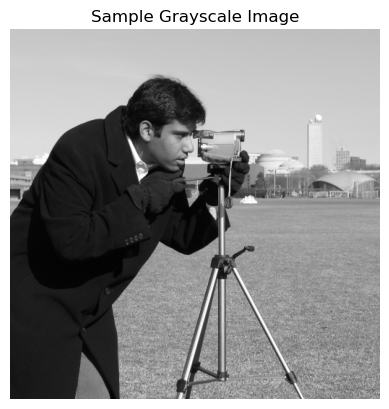

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Load a sample image (camera photo of a man)
image = data.camera()  # grayscale image (512x512 pixels)

print("Image shape:", image.shape)
print("Data type:", image.dtype)

# Display the image
plt.imshow(image, cmap="gray")
plt.title("Sample Grayscale Image")
plt.axis("off")
plt.show()

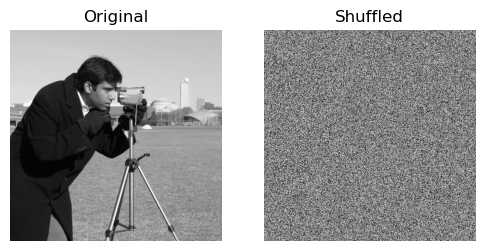

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

img = data.camera()

# Scramble the same numbers (destroys spatial structure)
shuffled = img.flatten()
rng = np.random.default_rng(0)
rng.shuffle(shuffled)
shuffled = shuffled.reshape(512, 512)

fig, ax = plt.subplots(1, 2, figsize=(6, 3))
ax[0].imshow(img, cmap="gray"); ax[0].set_title("Original"); ax[0].axis("off")
ax[1].imshow(shuffled, cmap="gray"); ax[1].set_title("Shuffled"); ax[1].axis("off")
plt.show()


### Color Images

shape: (512, 512, 3) dtype: uint8


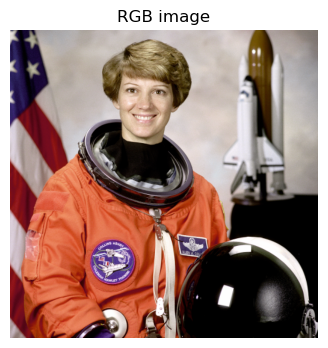

In [ ]:

import skimage
from skimage import data
rgb = data.astronaut()
print("shape:", rgb.shape, "dtype:", rgb.dtype)
fig, ax = plt.subplots(figsize=(4,4))
ax.imshow(rgb); ax.set_title("RGB image"); ax.axis("off")
plt.show()

👉 Note how `color_img.shape` has 3 values: `(height, width, channels)` — the last dimension is **RGB channels**.

---

### Why "Arrays" Matter in Image Processing

Since images are just arrays:

* We can apply **mathematical operations** (e.g., add brightness, filter noise, blur edges).
* We can use **neighborhood operations** (convolutions, filters) that depend on nearby pixels.
* We can easily transform images with NumPy operations.

Example: Inverting a grayscale image

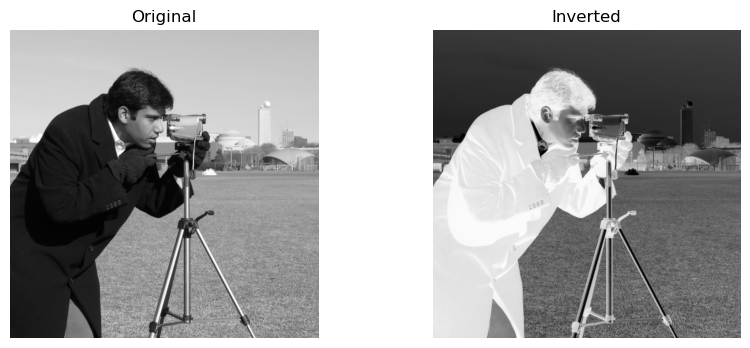

In [4]:
# Invert grayscale image
inverted = 255 - image

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(inverted, cmap="gray")
ax[1].set_title("Inverted")
ax[1].axis("off")

plt.show()

# 📌 2 Images Can Have Two Dimensions or More

### 🔑 Key Idea

* We usually think of images as **2D** (width × height) because we view them on screens or paper.
* But in science (e.g., brain imaging, medical scans), images can be **3D** or even higher-dimensional.
* As long as **spatial relationships** between pixels/voxels matter, it still counts as an *image*.

An image doesn’t have to be flat. In neuroscience and scientific imaging, data often lives in **3D (volumes)** or **4D (volumes over time)**. The “image-as-array” framework extends naturally — the extra axes just represent more spatial dimensions or additional measurements per location.&#x20;

---

### 🖼️ Types of Image Dimensions

1. **2D Image (Grayscale )**

   * Normal photos, X-rays, handwritten digit datasets.
   * Represented as `array[height, width]`.

2. **3D Image (Volume data)**
   * RGB :  `array[height, width, channels]`.
   * Example: brain scans (MRI, CT).
   * Represented as `array[depth, height, width]`.
   * Each element is called a **voxel** (volume pixel).

3. **4D Image (Time series of 3D volumes)**

   * Example: functional MRI (fMRI), videos.
   * Represented as `array[depth, height, width, time]`.

---

### ⚡ Intuition

* **Pixels** → 2D location values.
* **Voxels** → 3D cubes with intensity values.
* **Higher-D data** → stack of volumes/images across time or conditions.



#### 1. 2D Grayscale Image

2D image shape: (512, 512)


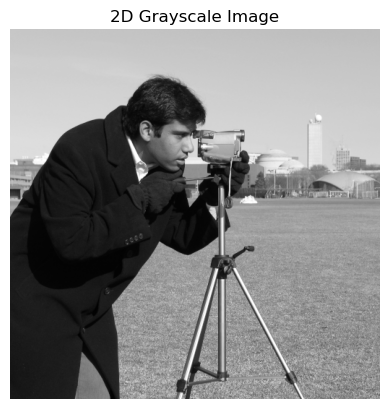

In [5]:
from skimage import data
import matplotlib.pyplot as plt

image_2d = data.camera()  # 2D grayscale

print("2D image shape:", image_2d.shape)  # (512, 512)

plt.imshow(image_2d, cmap="gray")
plt.title("2D Grayscale Image")
plt.axis("off")
plt.show()

#### 2. 3D Volumetric Image (MRI of human brain)

3D MRI shape: (10, 256, 256)


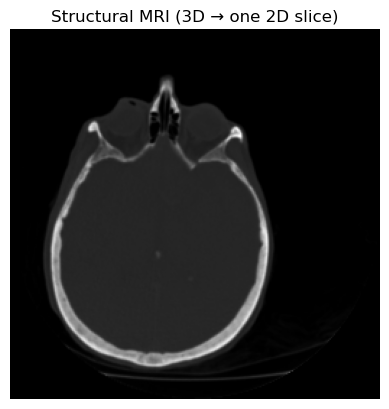

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Load sample 3D structural MRI (depth, height, width)
image_3d = data.brain()
print("3D MRI shape:", image_3d.shape)  # (Z, Y, X)

# Pick the middle slice along the depth axis
mid_slice = image_3d[image_3d.shape[0] // 2]

# Show this 2D slice
plt.imshow(mid_slice, cmap="gray")
plt.title("Structural MRI (3D → one 2D slice)")
plt.axis("off")
plt.show()


#### 3. 4D Example :fMRI Data

[get_dataset_dir] Dataset found in C:\Users\Saye\nilearn_data\haxby2001
Using file: C:\Users\Saye\nilearn_data\haxby2001\subj2\bold.nii.gz
Image shape: (40, 64, 64, 1452)
Voxel sizes (mm) and TR (s): (np.float32(3.5), np.float32(3.75), np.float32(3.75), np.float32(2.5))


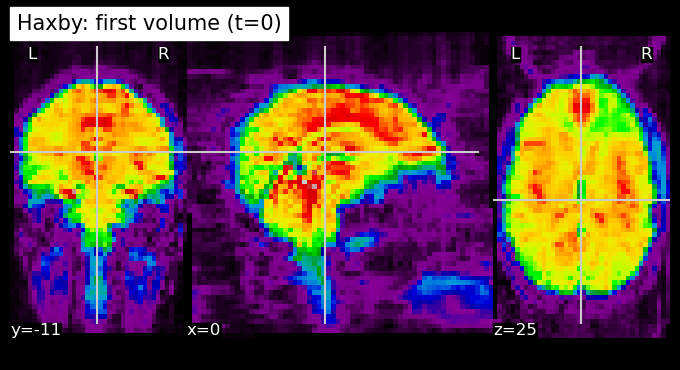

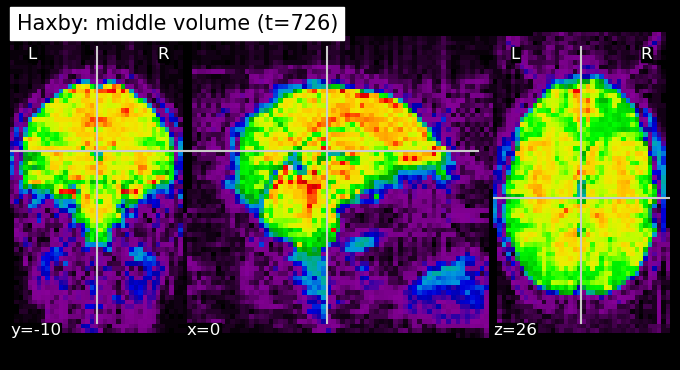

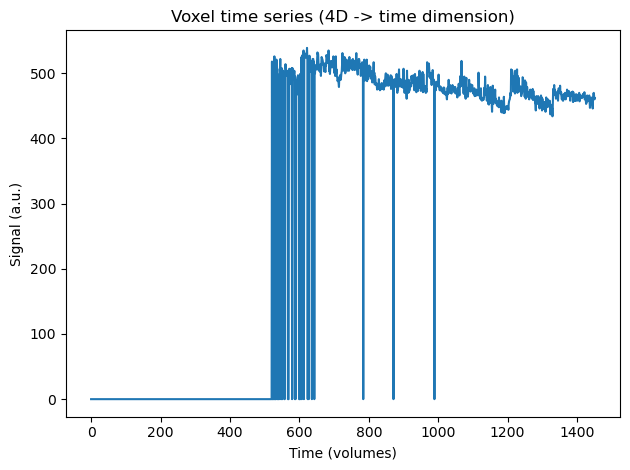

In [26]:
from nilearn import datasets, image, plotting
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# 1) Fetch a 4D fMRI dataset (Haxby 2001)
haxby = datasets.fetch_haxby()             # downloads to ~/nilearn_data by default
bold_path = haxby.func[0]                  # first run (4D NIfTI)
img = image.load_img(bold_path)

# 2) Inspect shape: (X, Y, Z, T) -> T is time
print("Using file:", bold_path)
print("Image shape:", img.shape)           # expect 4D
zooms = nib.load(bold_path).header.get_zooms()
print("Voxel sizes (mm) and TR (s):", zooms)  # (dx, dy, dz, TR)

# 3) Extract & plot a couple of volumes to show time dimension
first_vol = image.index_img(img, 0)
mid_vol   = image.index_img(img, img.shape[3] // 2)

plotting.plot_epi(first_vol, title="Haxby: first volume (t=0)")
plotting.plot_epi(mid_vol,   title=f"Haxby: middle volume (t={img.shape[3]//2})")

# 4) Plot a voxel time series to *see* the 4th dimension
data = img.get_fdata()                     # shape: (X, Y, Z, T)
T = data.shape[3]

# pick a voxel with high variance to make the signal visible
flat = data.reshape(-1, T)
v_idx = np.argmax(np.var(flat, axis=1))
voxel_ts = flat[v_idx, :]

plt.figure()
plt.plot(voxel_ts)
plt.xlabel("Time (volumes)")
plt.ylabel("Signal (a.u.)")
plt.title("Voxel time series (4D -> time dimension)")
plt.tight_layout()

plotting.show()


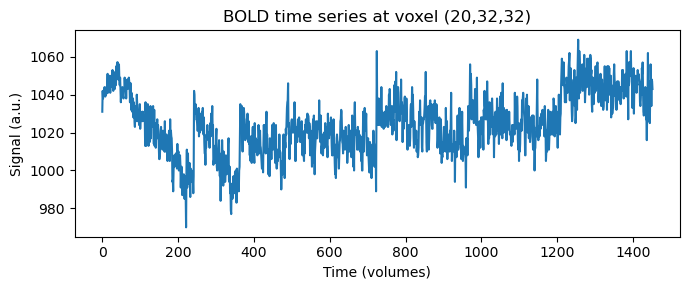

Mean: 1024.546831955923
Std : 15.682319171334191


In [30]:
X, Y, Z, T = data.shape
i, j, k = X//2, Y//2, Z//2   # center voxel for demo
ts = data[i, j, k, :]        # length T

plt.figure(figsize=(7, 3))
plt.plot(ts)
plt.xlabel("Time (volumes)")
plt.ylabel("Signal (a.u.)")
plt.title(f"BOLD time series at voxel ({i},{j},{k})")
plt.tight_layout(); plt.show()

print("Mean:", float(np.mean(ts)))
print("Std :", float(np.std(ts)))

# 📌 3 Images Can Have Other Special Dimensions

## 🔑 Concept summary (short & sweet)

* **Channels**: Extra dimensions can encode *properties at each location*, e.g., color channels (R, G, B). A color image is typically shaped **(height, width, 3)**.
* **Order matters for interpretation**: Libraries might store channels as **RGB** or **BGR**. Use a **consistent** order when reading/writing/plotting.
* **Time is different from channels**: A stack of images over time (e.g., fMRI volumes across time) adds a **temporal axis**. Unlike channels, **time is ordered** and suited for time-series analysis.

---

## 🧠 Intuition

* In grayscale (2D), each pixel stores **one** intensity.
* In color (3D), each pixel stores **three** intensities → *(R, G, B)*.
* For videos or time-series images (4D+), you add a **time** axis → shape often like *(time, height, width, channels)* or *(time, depth, height, width)* in volumetric data.

---

## 🧪 Example with `skimage.data.astronaut`

We’ll:

1. load the image,
2. check shape & dtype,
3. plot it and mark two pixels,
4. read those pixels & interpret their colors,
5. peek at channels and show why channel order matters.

> The “astronaut” image is 512×512 with 3 channels (RGB), stored as `uint8` → each value is an integer in **\[0, 255]**.

### Load & inspect

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

img = data.astronaut()  # shape: (H, W, 3) in RGB
print("shape:", img.shape)  # (512, 512, 3)
print("dtype:", img.dtype)  # uint8 (0..255 per channel)

shape: (512, 512, 3)
dtype: uint8


### Visualize + mark two pixels

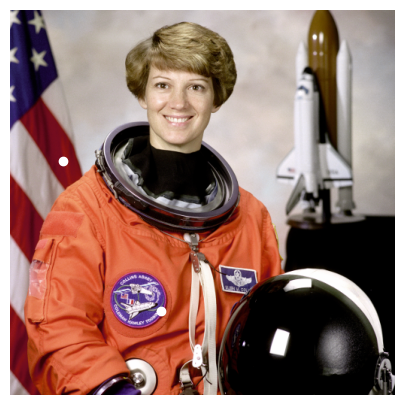

In [32]:
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(img)  # matplotlib expects RGB by default
# Note: ax.plot(x, y). Indexing is img[row=y, col=x].
ax.plot(70, 200, marker='o', markersize=6, color="white")   # red stripe on the flag
ax.plot(200, 400, marker='o', markersize=6, color="white")  # blue-ish patch on suit
ax.set_axis_off()
plt.show()

### Read pixel values & interpret

In [ ]:
# Remember: img[y, x] because first index is row (y), second is col (x)
p_redish  = img[200, 70]   # near red stripe
p_blueish = img[400, 200]  # blue-ish patch

print("img[200, 70] =", p_redish)   
print("img[400, 200] =", p_blueish) 



img[200, 70] = [122  14  29]
img[400, 200] = [ 79  36 126]


### Interpretation:
**Larger R than G,B -> looks redder. Larger B than R,G -> looks bluer.**

-----


## 🔎 Channels: splitting, viewing, and reordering

### Split channels (R, G, B)

shape: (512, 512, 3) dtype: uint8 range: (np.uint8(0), np.uint8(255))


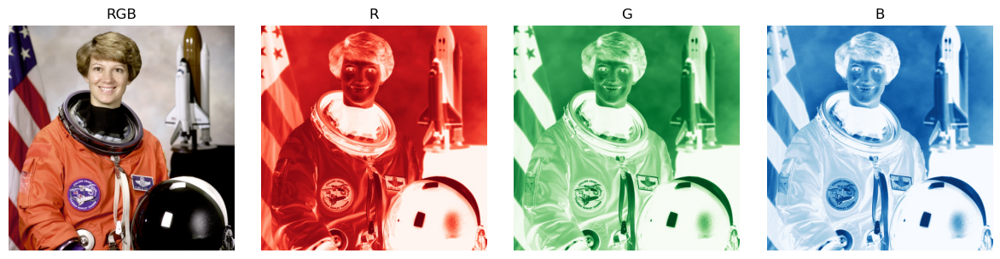

In [37]:

print("shape:", img.shape, "dtype:", img.dtype, "range:", (img.min(), img.max()))

# Split
R, G, B = img[..., 0], img[..., 1], img[..., 2]

# Visualize channels
fig, ax = plt.subplots(1, 4, figsize=(12, 3))
ax[0].imshow(img); ax[0].set_title("RGB"); ax[0].axis("off")
ax[1].imshow(R, cmap="Reds"); ax[1].set_title("R"); ax[1].axis("off")
ax[2].imshow(G, cmap="Greens"); ax[2].set_title("G"); ax[2].axis("off")
ax[3].imshow(B, cmap="Blues"); ax[3].set_title("B"); ax[3].axis("off")
plt.tight_layout(); plt.show()

# Recombine (just to illustrate)
recon = np.dstack([R, G, B])
assert np.allclose(recon, img)

### Reorder channels to illustrate why consistency matters

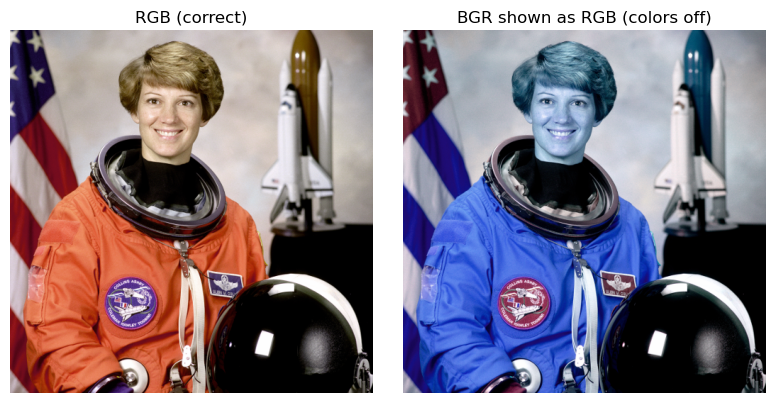

In [35]:
# Wrong order on purpose: BGR instead of RGB
bgr = np.stack([B, G, R], axis=-1)

fig, axs = plt.subplots(1, 2, figsize=(8,4))
axs[0].imshow(img); axs[0].set_title("RGB (correct)"); axs[0].axis("off")
axs[1].imshow(bgr); axs[1].set_title("BGR shown as RGB (colors off)"); axs[1].axis("off")
plt.tight_layout(); plt.show()


> If you accidentally treat **BGR** data as **RGB**, colors will look strange (e.g., reds become bluish).
> Some libraries (like OpenCV) load in **BGR** by default, so you often need `img[..., ::-1]` to convert BGR→RGB before plotting with Matplotlib.

---

## 🧯 Common pitfalls & quick fixes

* **dtype & range**:

  * `uint8`: values must be `0 to 255`.
  * `float` images: Matplotlib/`skimage` expect values scaled to `0 to 1`.
* **Channel order**: Know whether your data is **RGB** or **BGR**. Convert before plotting or computing.
* **Time axis vs channels**: Don’t confuse them; channels are categorical (per-pixel properties), time is ordered.

### Safe dtype conversion examples

In [36]:
# uint8 (0..255) -> float (0..1)
img_float = img.astype(np.float32) / 255.0

# float (0..1) -> uint8 (0..255)
img_uint8 = (np.clip(img_float, 0, 1) * 255).astype(np.uint8)

# 📌 4 Operations with Images

Images are structured data → we can apply **operations** that transform them while preserving important spatial structure.
One of the most common operations is **filtering**.

---

## 4.1 Filtering

### 🔑 Key Idea

* A **filter** takes an image in → produces a new image out.
* The filter **keeps some information** while **discarding or transforming other information**.
* Example: converting a color image to grayscale.

---

### 🖼️ Grayscale Conversion

**Grayscale conversion** is a simple filter:

* Keeps luminance (brightness) info.
* Discards color.
* Result: same width/height, but fewer channels → simpler image for processing.

* A color image has 3 channels (R, G, B).
* To convert to grayscale, these channels are combined into **one value per pixel**.
* The formula weights channels by **human visual sensitivity**:

  * We are more sensitive to green, less to blue.
  * So grayscale isn’t just the average; it’s a weighted sum.

👉 This reduces the image from shape **(H, W, 3)** → **(H, W)**.



---

### 🧪 Example: Astronaut in Grayscale

Original shape: (512, 512, 3)
Grayscale shape: (512, 512)


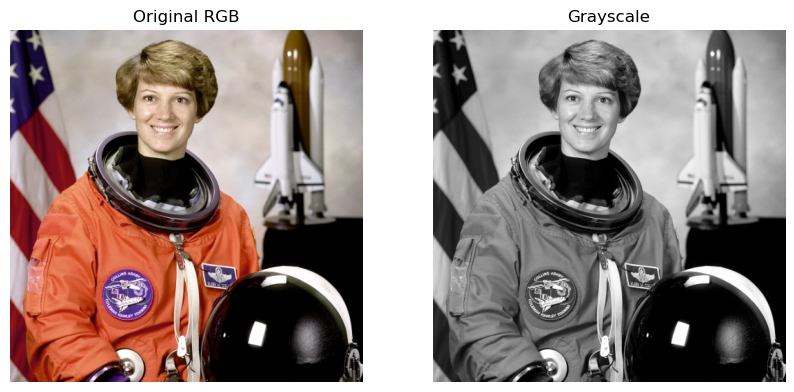

In [38]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.color import rgb2gray

# Load color image
img = data.astronaut()
print("Original shape:", img.shape)  # (512, 512, 3)

# Convert to grayscale
gray_img = rgb2gray(img)
print("Grayscale shape:", gray_img.shape)  # (512, 512)

# Display both
fig, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].imshow(img)
ax[0].set_title("Original RGB"); ax[0].axis("off")

ax[1].imshow(gray_img, cmap="gray")
ax[1].set_title("Grayscale"); ax[1].axis("off")

plt.show()

### 🔍 Pixel Values in Grayscale

* After conversion, each pixel is a **float in \[0, 1]** (because `rgb2gray` returns floats).
* `0` = black (no light), `1` = white (full light).

In [39]:
print("Pixel [200, 70] RGB:", img[200, 70])
print("Pixel [200, 70] Grayscale:", gray_img[200, 70])

Pixel [200, 70] RGB: [122  14  29]
Pixel [200, 70] Grayscale: 0.14914313725490194


#  Pixel values after Grayscale Conversion

Earlier, we highlighted two pixels in the astronaut image:

* **`img[200, 70]`** → red stripe in the flag.
* **`img[400, 200]`** → blue patch on the spacesuit.

Now we want to check:
👉 What values do these pixels take **after converting to grayscale**?
👉 Are they high (bright) or low (dark)?
👉 Why do they look that way?

---

### 🔍 Step 1. Original RGB values

In [40]:
from skimage import data, color

img = data.astronaut()
gray_img = color.rgb2gray(img)

p_redish  = img[200, 70]     # pixel in red stripe
p_blueish = img[400, 200]    # pixel in blue patch

print("RGB [200,70] =", p_redish)
print("RGB [400,200] =", p_blueish)

RGB [200,70] = [122  14  29]
RGB [400,200] = [ 79  36 126]



### 🔍 Step 2. Grayscale values

In [41]:
print("Gray [200,70] =", gray_img[200, 70])
print("Gray [400,200] =", gray_img[400, 200])

Gray [200,70] = 0.14914313725490194
Gray [400,200] = 0.20245686274509805


### 🧠 Why these values?

The function `rgb2gray` uses a **weighted sum of RGB channels** to mimic human vision:

$$
\text{Gray} = 0.2125 \cdot R + 0.7154 \cdot G + 0.0721 \cdot B
$$

* Human eyes are most sensitive to **green**, then **red**, least to **blue**.
* That’s why a bright blue pixel doesn’t look very bright in grayscale.

👉 In our example:

* **Red stripe pixel** → high R, low G/B → moderate gray value (not bright, since green is missing).
* **Blue patch pixel** → high B, but blue contributes little → dark gray.

---
---

# 4.2 Convolution Filters

## 🔑 Core Idea

* A **convolution filter** replaces each pixel with a **weighted sum of its neighbors**.
* The set of weights is called the **kernel** (or filter mask).
* This operation lets us:

  * Blur images
  * Detect edges
  * Sharpen features
* Convolutions are **local operations**: each pixel’s new value depends on its neighborhood.

---

## 🧠 Intuition

* Imagine sliding a **small window (kernel)** across the image.
* At each position:

  1. Multiply each neighbor pixel by the kernel’s weight.
  2. Sum them up.
  3. Replace the center pixel with this sum.

👉 This emphasizes certain patterns (e.g., edges, smoothness) depending on the kernel.

---

## 🧪 Step 1. Toy Example (4×5 image)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def imshow_with_annot(
    A,
    ax=None,
    cmap="gray",
    vmin=None,
    vmax=None,
    fmt="{:.0f}",
    fontsize=12,
    text_color="auto",   # "auto" picks white/black for contrast; or pass a color string
    title=None,
    interpolation="nearest",
):
    """
    Show a 2D array as an image and annotate each pixel with its numeric value.

    Parameters
    ----------
    A : 2D array-like
        Image to display.
    ax : matplotlib Axes, optional
        Axes to plot into. If None, creates a new figure+axes.
    cmap : str
        Matplotlib colormap.
    vmin, vmax : float, optional
        Color scaling range. Defaults to min/max of A.
    fmt : str
        Format string for values (e.g., '{:.0f}' or '{:.2f}').
    fontsize : int
        Annotation font size.
    text_color : str or "auto"
        If "auto", selects white/black for contrast against the background.
        Otherwise, use any valid Matplotlib color string.
    title : str, optional
        Title to show above the image.
    interpolation : str
        Passed to imshow (use 'nearest' to keep blocky pixels).
    """
    A = np.asarray(A)
    assert A.ndim == 2, "imshow_with_annot expects a 2D array."

    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 6))
    else:
        fig = ax.figure

    # draw the image
    im = ax.imshow(A, cmap=cmap, vmin=vmin, vmax=vmax, interpolation=interpolation)

    # remove axes ticks/frames like your screenshot
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

    if title:
        ax.set_title(title, fontsize=12, pad=10)

    # precompute normalization and colormap to choose text color if needed
    norm = im.norm
    cm = im.cmap

    # annotate each cell
    nr, nc = A.shape
    for i in range(nr):
        for j in range(nc):
            val = A[i, j]
            s = fmt.format(val)

            # pick text color for contrast
            if text_color == "auto":
                # map value -> rgba via the same colormap and norm
                rgba = cm(norm(val))
                r, g, b = rgba[:3]
                # perceived luminance
                lum = 0.2126 * r + 0.7152 * g + 0.0722 * b
                c = "white" if lum < 0.5 else "black"
            else:
                c = text_color

            ax.text(
                j, i, s,
                ha="center", va="center",
                color=c, fontsize=fontsize,
            )

    return im, ax


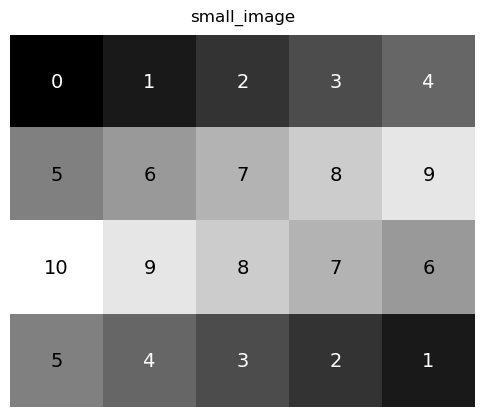

In [2]:
small_image = np.array([
    [0, 1, 2, 3, 4],
    [5, 6, 7, 8, 9],
    [10, 9, 8, 7, 6],
    [5, 4, 3, 2, 1]
])

imshow_with_annot(small_image, fmt="{:.0f}", fontsize=14, title="small_image")
plt.show()


### Define a kernel

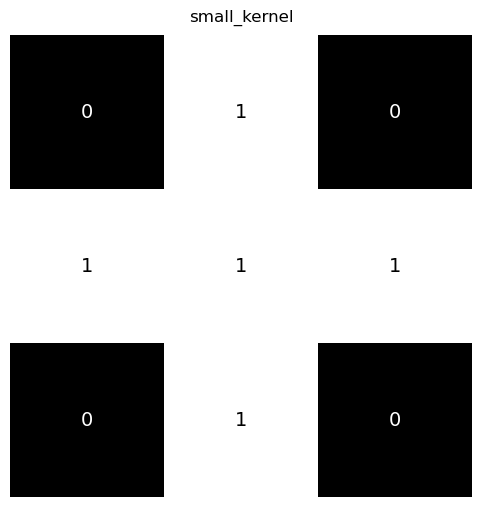

In [3]:
small_kernel = np.array([
    [0, 1, 0],
    [1, 1, 1],
    [0, 1, 0]
])
imshow_with_annot(small_kernel, fmt="{:.0f}", fontsize=14, title="small_kernel")
plt.show()

This kernel says: *take the center pixel plus its 4 neighbors (N, S, E, W)*.

---

## 🧪 Step 2. Manual Convolution at One Pixel

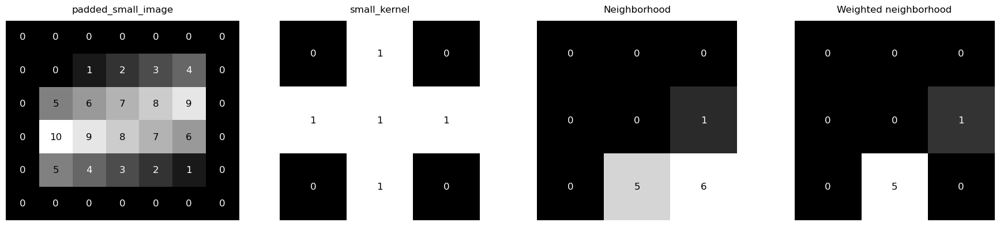

Convolved value at (0,0): 6


In [4]:
# --- Single convolution step visualization in subplots ---

# Pad the image with zeros (to handle edges) 
padded = np.pad(small_image, 1, mode="constant")

# Neighborhood around top-left pixel (original [0,0])
neighborhood = padded[0:3, 0:3]

# Weighted product
weighted = neighborhood * small_kernel

# Plot all in one row
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

imshow_with_annot(padded, ax=axes[0], fmt="{:.0f}", title="padded_small_image")
imshow_with_annot(small_kernel, ax=axes[1], fmt="{:.0f}", title="small_kernel")
imshow_with_annot(neighborhood, ax=axes[2], fmt="{:.0f}", title="Neighborhood")
imshow_with_annot(weighted, ax=axes[3], fmt="{:.0f}", title="Weighted neighborhood")

plt.tight_layout()
plt.show()

# Sum to get convolution result
conv_pixel = np.sum(weighted)
print("Convolved value at (0,0):", conv_pixel)


👉 This value replaces the pixel at `(0,0)` in the output.

---

## 🧪 Step 3. Loop Over All Pixels

(<matplotlib.image.AxesImage at 0x1fa92faa210>,
 <Axes: title={'center': 'result'}>)

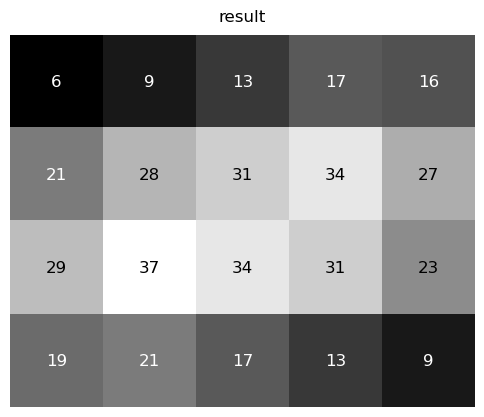

In [5]:
result = np.zeros_like(small_image)

for i in range(result.shape[0]):
    for j in range(result.shape[1]):
        neighborhood = padded[i:i+3, j:j+3]
        weighted = neighborhood * small_kernel
        result[i, j] = np.sum(weighted)


imshow_with_annot(result, fmt="{:.0f}", title="result")

Got it 👍 Let’s expand and make it clearer, especially linking to **neuroscience applications**. Here’s a rewritten version with more depth but still direct and structured:

---

# 4.3 Convolution Filters in Scikit-Image

## 🔑 Why use Scikit-Image filters?

* **Optimized implementations** – Functions in `skimage.filters` are written to be efficient and reliable, so you don’t have to re-implement them from scratch.
* **Automatic handling** – Takes care of tricky parts like **padding edges** and correct **array indexing**, which avoids artifacts at image boundaries.
* **Speed** – Uses **vectorized operations** (NumPy, Cython, C backends) → far faster than Python loops.
* **Flexibility** – Works not only on **2D images** (like microscope snapshots) but also on **3D or higher-dimensional scientific datasets** (e.g., brain fMRI or calcium imaging volumes).

---

## 1. Gaussian Filter

The **Gaussian filter** smooths the image (or volume) by reducing high-frequency noise. It does this by averaging pixels (or voxels) with their neighbors, weighted by a Gaussian curve: closer pixels count more, farther ones count less.

### 📌 Key Parameters

* `sigma`: standard deviation of the Gaussian.

  * Small `sigma` → slight blur (fine details preserved).
  * Large `sigma` → strong blur (fine details removed, only large structures remain).
* `multichannel`: specify if the data has color channels (e.g., RGB) vs single-channel grayscale.
* `preserve_range`: keeps original intensity values (important for scientific images).

### 🧠 Neuroscience Implications

* **Noise reduction in brain scans** – fMRI, MRI, or calcium imaging data are often noisy. Gaussian filtering helps improve the signal-to-noise ratio by smoothing random fluctuations.
* **Preprocessing step** – Commonly used before segmentation (e.g., detecting brain regions, neurons, or blood vessels) to reduce artifacts.
* **Spatial scale control** – By adjusting `sigma`, researchers can emphasize different brain structures:

  * Small sigma → highlights fine details (neuronal spines, thin axons).
  * Large sigma → highlights coarse features (entire cortical layers, brain regions).
* **Biological analogy** – The Gaussian filter resembles how receptive fields in the visual system integrate information: nearby signals have stronger influence than distant ones.
* **Statistical analyses** – In fMRI studies, smoothing with Gaussian kernels helps meet assumptions of statistical models (spatial correlation of signals).






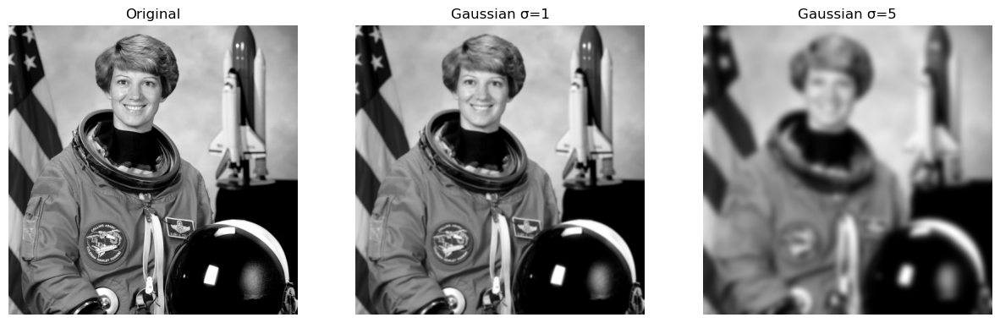

In [10]:
from skimage import data, color
from skimage.filters import gaussian
import matplotlib.pyplot as plt

astro = data.astronaut()
gray = color.rgb2gray(astro)

# Gaussian blur with different sigma values
blur1 = gaussian(gray, sigma=1)
blur5 = gaussian(gray, sigma=5)

fig, ax = plt.subplots(1, 3, figsize=(15,5))
ax[0].imshow(gray, cmap="gray");   ax[0].set_title("Original")
ax[1].imshow(blur1, cmap="gray");  ax[1].set_title("Gaussian σ=1")
ax[2].imshow(blur5, cmap="gray");  ax[2].set_title("Gaussian σ=5")
for a in ax: a.axis("off")
plt.show()

**Implications in fMRI:**

* Gaussian smoothing is routinely applied to fMRI volumes.
* It increases **signal-to-noise ratio (SNR)** by pooling over neighboring voxels.
* Helps align signals across subjects (reduces anatomical variability).
* Trade-off: too much smoothing → loss of spatial precision (blurs small activations).



## how Gaussian kernels look

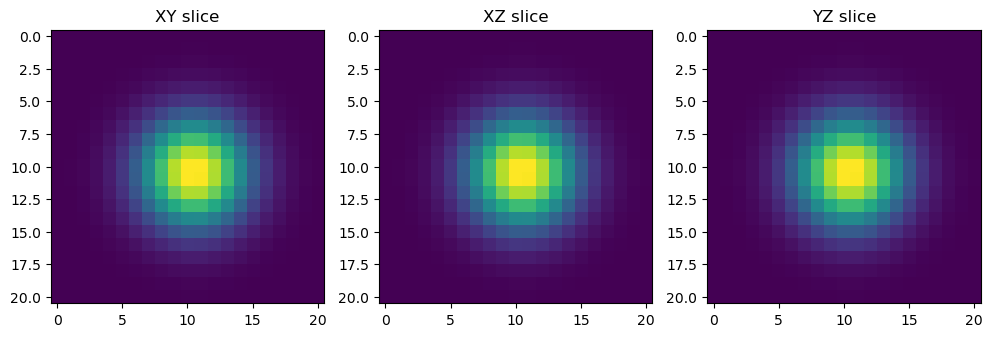

In [11]:
from scipy.ndimage import gaussian_filter

# Parameters
size = 21
sigma = 3

# Create 3D grid
x = np.linspace(-size//2, size//2, size)
y = np.linspace(-size//2, size//2, size)
z = np.linspace(-size//2, size//2, size)
x, y, z = np.meshgrid(x, y, z)

# 3D Gaussian
g3d = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
g3d /= g3d.sum()

# Visualize central slices
fig, axes = plt.subplots(1,3, figsize=(12,4))
axes[0].imshow(g3d[size//2,:,:], cmap="viridis")
axes[0].set_title("XY slice")
axes[1].imshow(g3d[:,size//2,:], cmap="viridis")
axes[1].set_title("XZ slice")
axes[2].imshow(g3d[:,:,size//2], cmap="viridis")
axes[2].set_title("YZ slice")
plt.show()


---




# 4.3 Convolution Filters in Scikit-Image

## 2. Sobel Filter (Edge Detection)

The **Sobel filter** is used to highlight **edges** — areas where image intensity changes quickly. It works by applying two small convolution kernels that approximate the image’s **derivative**:

* One detects **horizontal changes** (edges running vertically).
* One detects **vertical changes** (edges running horizontally).
* These are then combined to give the **gradient magnitude** (overall edge strength).

---

### 📌 Key Properties

* **Sensitive to edges** → shows boundaries of structures.
* **Not good for noise** → noise also creates sharp changes, so preprocessing (e.g., Gaussian blur) is often applied before Sobel.
* **Direction-aware** → gives gradient orientation (horizontal vs. vertical edges).

---

### 🧠 Neuroscience Implications

* **Detecting anatomical boundaries** – e.g., separating gray matter from white matter in MRI, or outlining neurons in microscopy.
* **Feature extraction for analysis** – edge maps can be input into algorithms for detecting brain regions, vessels, or dendritic spines.
* **Preprocessing step in segmentation pipelines** – helps find contours of structures before labeling or measuring them.
* **Biological analogy** – Sobel filtering mimics how **neurons in early visual cortex (V1)** respond strongly to edges and oriented lines.

---

## 👉 Code & Visualization

### 1. Show Sobel Kernels




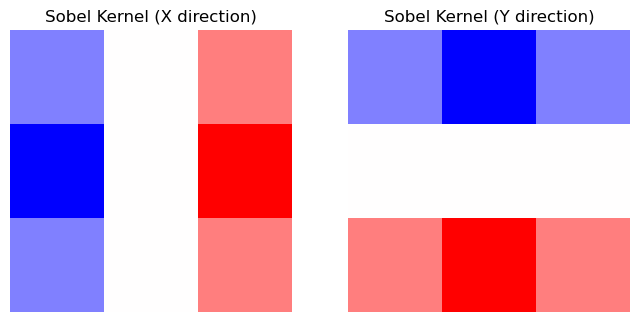

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Sobel operator kernels
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])

fig, axes = plt.subplots(1, 2, figsize=(8,4))
axes[0].imshow(sobel_x, cmap="bwr", vmin=-2, vmax=2)
axes[0].set_title("Sobel Kernel (X direction)")
axes[0].axis("off")

axes[1].imshow(sobel_y, cmap="bwr", vmin=-2, vmax=2)
axes[1].set_title("Sobel Kernel (Y direction)")
axes[1].axis("off")

plt.show()


### 2. Apply Sobel to an Image

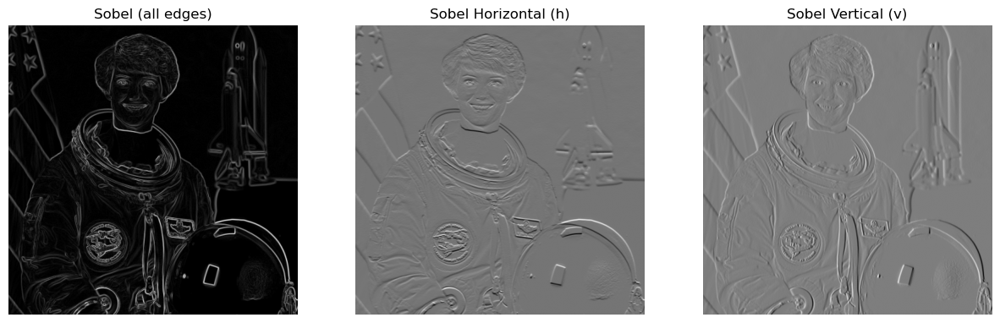

In [11]:
from skimage.filters import sobel, sobel_h, sobel_v

sob = sobel(gray)
sob_h = sobel_h(gray)
sob_v = sobel_v(gray)

fig, ax = plt.subplots(1, 3, figsize=(15,5))
ax[0].imshow(sob, cmap="gray");   ax[0].set_title("Sobel (all edges)")
ax[1].imshow(sob_h, cmap="gray"); ax[1].set_title("Sobel Horizontal (h)")
ax[2].imshow(sob_v, cmap="gray"); ax[2].set_title("Sobel Vertical (v)")
for a in ax: a.axis("off")
plt.show()

### 📌 Arguments

1. **`image` (array-like)**

   * Input image.
   * Must be **2D grayscale** (if RGB, convert with `skimage.color.rgb2gray`).
   * Can also work on **scientific images** (e.g., MRI slices, microscopy frames).

2. **`mask` (ndarray of bools, optional)**

   * A binary mask specifying which pixels should be processed.
   * Pixels outside the mask are **ignored (set to 0 in the output)**.
   * Useful in neuroscience when analyzing only a **region of interest (ROI)** — e.g., restricting edge detection to the hippocampus, cortical layers, or a neuron’s dendrite.

3. **Return value**

   * A **float array** of the same shape as input.
   * Pixel values represent **edge strength** (0 = no edge, higher values = stronger edge).


### 🧠 Neuroscience Implications of Arguments

* **Grayscale input** → Most brain images are single-channel (intensity-based), so Sobel applies directly. For multi-channel fluorescence microscopy, convert to grayscale or apply Sobel per channel.
* **Masking** → Allows focusing on **specific brain regions** instead of the whole image. Example: detect vessel boundaries only inside a region labeled as "artery".
* **Gradient magnitude output** → Provides an **edge map** useful for further analysis, such as segmentation of cortical boundaries or neuron outlines.

**Implications in fMRI:**

* Sobel is not typically applied directly to fMRI data.
* But edge detectors are useful in **structural MRI** (finding cortical boundaries, skull stripping).
* In microscopy, edge filters help segment neurons, vessels, or other anatomical structures.
* For 2D images, `sobel_h` = horizontal edges, `sobel_v` = vertical edges (they won’t extend to 3D volumes).

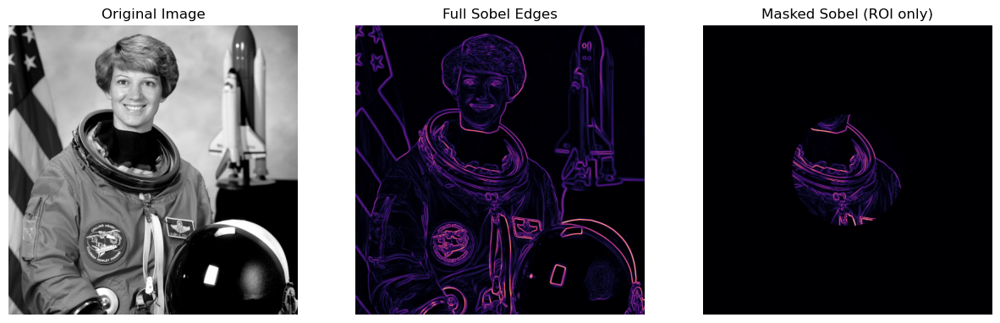

In [15]:
import matplotlib.pyplot as plt
from skimage import data, color, filters
import numpy as np

# Example: grayscale image
image = color.rgb2gray(data.astronaut())

# Full Sobel edge map
edges_full = filters.sobel(image)

# Use a circular mask (simulate ROI in brain image)
mask = np.zeros_like(image, dtype=bool)
rr, cc = np.ogrid[:image.shape[0], :image.shape[1]]
circle = (rr - image.shape[0]//2)**2 + (cc - image.shape[1]//2)**2 < (100**2)
mask[circle] = True

edges_masked = filters.sobel(image, mask=mask)

# Plot
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(edges_full, cmap="magma")
axes[1].set_title("Full Sobel Edges")
axes[1].axis("off")

axes[2].imshow(edges_masked, cmap="magma")
axes[2].set_title("Masked Sobel (ROI only)")
axes[2].axis("off")

plt.show()




---

## 3. Scharr & Prewitt Filters

The **Sobel filter** is the most common edge detector in Scikit-Image, but there are two important variants:

### 🔹 Prewitt Filter

* **Simpler version** of Sobel — it uses uniform weights instead of Sobel’s weighted center.
* Slightly **less accurate** in detecting diagonal edges.
* **Faster** and computationally cheaper, useful when speed > precision.

📌 *Neuroscience use*: Can be used for **quick boundary detection** in large brain datasets (e.g., rough segmentation of fMRI volumes).

---

### 🔹 Scharr Filter

* **Improved version** of Sobel.
* Designed to be more **rotation-invariant** (detects edges equally well in all directions).
* Produces **sharper, more precise edges** than Sobel or Prewitt.

📌 *Neuroscience use*: Better for detecting **curved or irregular boundaries** in MRI — e.g., interfaces between **gray and white matter** or **folded cortical regions**.

---

### ⚖️ Quick Comparison

| Filter      | Accuracy | Rotation Invariance | Speed  | Typical Use                    |
| ----------- | -------- | ------------------- | ------ | ------------------------------ |
| **Sobel**   | Good     | Moderate            | Medium | General-purpose edge detection |
| **Prewitt** | Lower    | Moderate            | Fast   | Fast, rough boundary detection |
| **Scharr**  | Higher   | Strong              | Medium | Precise brain structure edges  |

---

### 🧠 Implications in fMRI & Neuroscience

* **Structural preprocessing** → detecting brain boundaries before segmentation.
* **Gray vs. white matter segmentation** → Scharr often gives cleaner separation.
* **Feature extraction** → edge maps can highlight anatomical structures (gyri, sulci, vessels).
* **Computational trade-offs**:

  * Prewitt = good for quick scans of large 3D datasets.
  * Sobel = balanced choice.
  * Scharr = best when accuracy and rotational consistency matter.




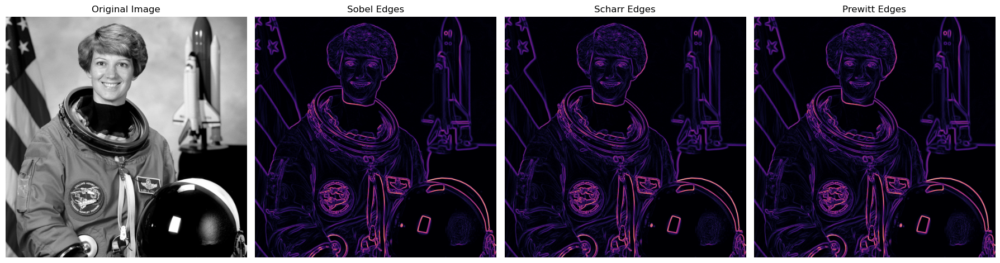

In [16]:
import matplotlib.pyplot as plt
from skimage import data, color, filters

# Load example image (astronaut works well as a brain-like test image with soft edges)
image = color.rgb2gray(data.astronaut())

# Apply filters
edges_sobel = filters.sobel(image)
edges_scharr = filters.scharr(image)
edges_prewitt = filters.prewitt(image)

# Visualize
fig, axes = plt.subplots(1, 4, figsize=(18, 6))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(edges_sobel, cmap="magma")
axes[1].set_title("Sobel Edges")
axes[1].axis("off")

axes[2].imshow(edges_scharr, cmap="magma")
axes[2].set_title("Scharr Edges")
axes[2].axis("off")

axes[3].imshow(edges_prewitt, cmap="magma")
axes[3].set_title("Prewitt Edges")
axes[3].axis("off")

plt.tight_layout()
plt.show()


### Brain MRI with Sobel vs Scharr vs Prewitt

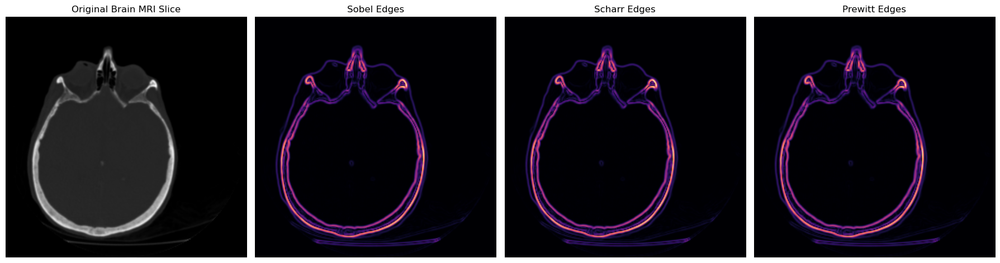

In [18]:
import matplotlib.pyplot as plt
from skimage import data, filters

# Load brain MRI (3D volume: 10 slices, 256x256 each)
image_volume = data.brain()

# Select a single slice (e.g., slice #5 out of 10)
image = image_volume[5]

# Apply edge detection filters
edges_sobel = filters.sobel(image)
edges_scharr = filters.scharr(image)
edges_prewitt = filters.prewitt(image)

# Visualize results
fig, axes = plt.subplots(1, 4, figsize=(18, 6))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Brain MRI Slice")
axes[0].axis("off")

axes[1].imshow(edges_sobel, cmap="magma")
axes[1].set_title("Sobel Edges")
axes[1].axis("off")

axes[2].imshow(edges_scharr, cmap="magma")
axes[2].set_title("Scharr Edges")
axes[2].axis("off")

axes[3].imshow(edges_prewitt, cmap="magma")
axes[3].set_title("Prewitt Edges")
axes[3].axis("off")

plt.tight_layout()
plt.show()




---



# 4. Median Filter

The **Median filter** is a **non-linear filter** that replaces each pixel with the **median value** of the pixels in its neighborhood.
Unlike Gaussian or mean filters (which average values), the median filter **preserves edges** while removing outlier noise.

---

### 📌 Key Properties

* **Noise removal** → excellent for eliminating **salt-and-pepper noise** (random bright or dark pixels).
* **Edge preservation** → since the median is less sensitive to extreme values, edges are not blurred as much as with Gaussian filtering.
* **Non-linear** → output is not a simple weighted sum, which makes it robust for images with strong intensity artifacts.

---

### 🧠 Neuroscience Implications

* **Microscopy images**: Removes random bright/dark speckles (e.g., shot noise in calcium imaging).
* **MRI/fMRI scans**: Reduces impulse noise while maintaining anatomical edges (important for brain region boundaries).
* **Segmentation preprocessing**: Produces cleaner masks for detecting neurons, vessels, or brain regions.
* **Better than Gaussian for structural preservation**: While Gaussian smooths everything (edges included), Median filtering keeps sharp boundaries intact — useful for distinguishing fine neuronal processes or cortical boundaries.

---

## 👉 Code & Visualization




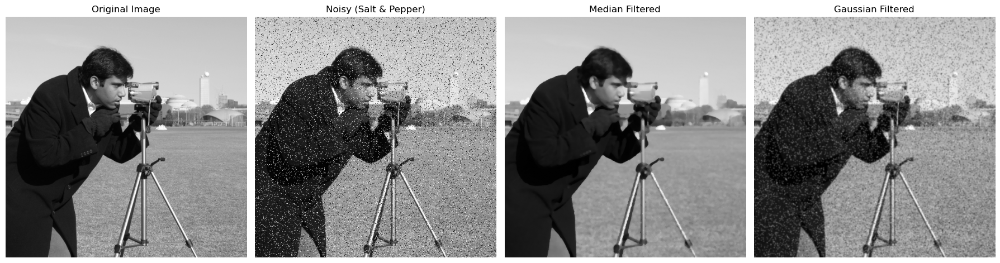

In [19]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, util, filters
from skimage.morphology import disk

# Load grayscale example image
image = data.camera()

# Add artificial "salt-and-pepper" noise
noisy = util.random_noise(image, mode='s&p', amount=0.1)

# Apply Median filter with neighborhood size
median_filtered = filters.median(noisy, disk(3))

# Compare with Gaussian for reference
gaussian_filtered = filters.gaussian(noisy, sigma=1)

# Visualize results
fig, axes = plt.subplots(1, 4, figsize=(18, 6))
axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(noisy, cmap="gray")
axes[1].set_title("Noisy (Salt & Pepper)")
axes[1].axis("off")

axes[2].imshow(median_filtered, cmap="gray")
axes[2].set_title("Median Filtered")
axes[2].axis("off")

axes[3].imshow(gaussian_filtered, cmap="gray")
axes[3].set_title("Gaussian Filtered")
axes[3].axis("off")

plt.tight_layout()
plt.show()



### 🔎 What you’ll see

* **Noisy image** → scattered white/black pixels (salt-and-pepper).
* **Median filter** → removes most noise **while preserving edges** (buildings, structures remain sharp).
* **Gaussian filter** → also reduces noise, but **edges become blurred**.


✅ This makes the median filter very attractive in neuroscience when you want to **denoise but not lose structural details** (neuronal dendrites, cortical folds, vessel outlines).

---
# 5. Laplace Filter (Second Derivative)

The **Laplace filter** is a convolution filter that computes the **second derivative** of the image.
While Sobel, Scharr, and Prewitt compute the **first derivative** (gradient → edges), the Laplace filter highlights areas where the gradient **changes rapidly** — essentially **fine details and points of sharp intensity variation**.

---

### 📌 Key Properties

* **Second-derivative filter** → responds strongly to regions of rapid intensity change.
* **More sensitive to fine details** than Sobel/Prewitt/Scharr.
* **Symmetric (no direction bias)** → detects edges in all orientations equally.
* **Highly sensitive to noise** → often used after smoothing (e.g., Gaussian filter).

---

### 🧠 Neuroscience Implications

* **Microscopy**: Enhances thin structures (axons, dendritic spines) by emphasizing fine edges.
* **MRI/fMRI**: Useful for detecting subtle tissue boundaries or small lesions.
* **Preprocessing for segmentation**: Highlights **boundaries** where gray matter transitions to white matter or cerebrospinal fluid.
* **Caveat**: Because it amplifies noise, Laplace filtering is often paired with **Gaussian smoothing** → known as the **Laplacian of Gaussian (LoG)** filter, widely used in medical imaging.

---

## 👉 Code & Visualization


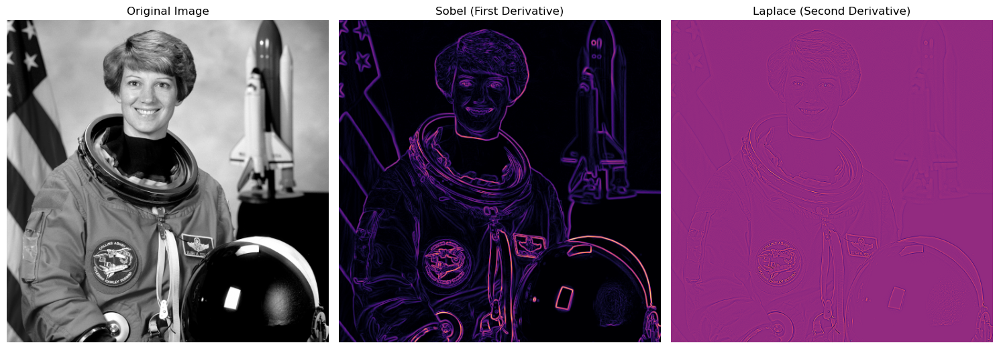

In [20]:
import matplotlib.pyplot as plt
from skimage import data, filters, color

# Load example grayscale image
image = color.rgb2gray(data.astronaut())

# Apply Laplace filter
edges_laplace = filters.laplace(image, ksize=3)

# Compare with Sobel for reference
edges_sobel = filters.sobel(image)

# Visualize results
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(edges_sobel, cmap="magma")
axes[1].set_title("Sobel (First Derivative)")
axes[1].axis("off")

axes[2].imshow(edges_laplace, cmap="magma")
axes[2].set_title("Laplace (Second Derivative)")
axes[2].axis("off")

plt.tight_layout()
plt.show()



### 🔎 What you’ll see

* **Sobel** → strong, clean edges outlining objects.
* **Laplace** → finer details appear, but also more noise and “halo-like” outlines.

* Sobel/Scharr/Prewitt → first derivative, best for **general edges**.
* Laplace → second derivative, best for **fine detail**, but requires **denoising first** (often via Gaussian).

---

# ✅ Summary

* **Gaussian (σ small → large)** → progressively smoother / blurrier; improves **signal-to-noise ratio** but reduces fine spatial detail.
* **Median** → removes isolated spikes/outliers (salt-and-pepper noise), preserves edges better than Gaussian.
* **Sobel / Scharr / Prewitt** → edge detectors (Scharr is usually most rotation-stable).
* **Laplace** → second-derivative edges; sensitive to **fine detail** but easily picks up noise.

---

# 📖 Quick Reading Guide for Neuroscience

* Use **Gaussian** to **denoise MRI/fMRI volumes or microscopy movies** before analysis.
* Use **Median** to clean up **salt-and-pepper-like artifacts** in calcium imaging or electrophysiology electrode maps.
* Use **Sobel / Scharr / Prewitt** when you need to **highlight brain boundaries, cortical folds, or neuron outlines**.
* Use **Laplace** (or better, **Laplacian of Gaussian**) to **detect fine microstructures** such as axons or vessels, but only after smoothing.

---

# 👁️ Visualizing Each Filter


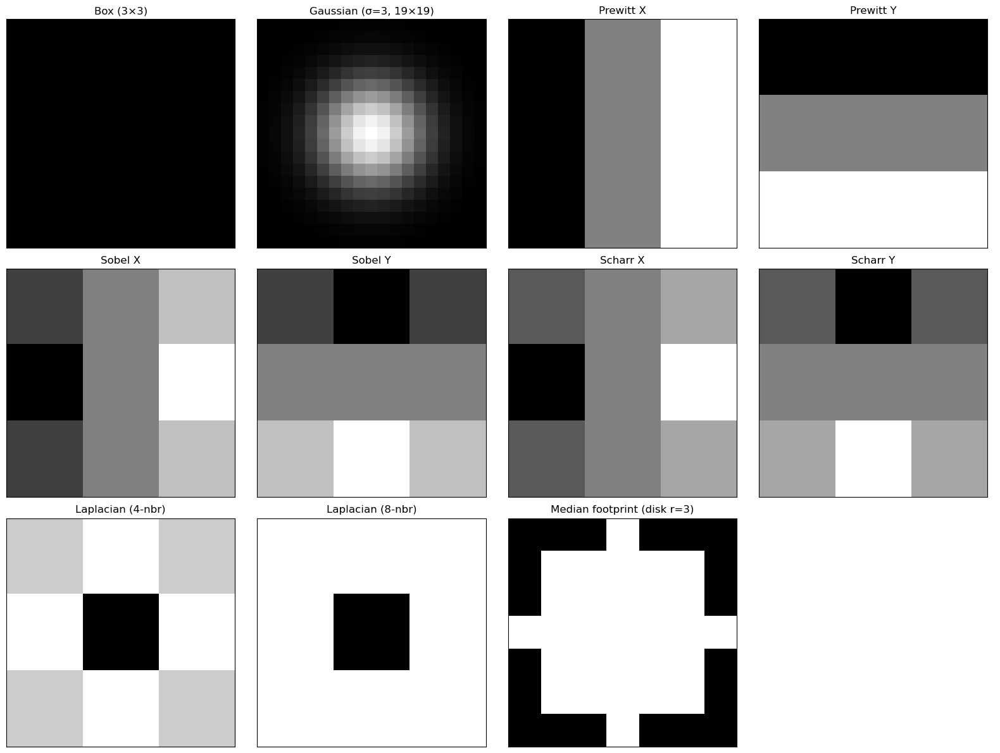

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk

# ---------- helpers ----------
def normalize01(a):
    a = np.asarray(a, dtype=float)
    amin, amax = a.min(), a.max()
    if amax == amin:
        return np.zeros_like(a)
    return (a - amin) / (amax - amin)

def gaussian_kernel(size=19, sigma=3.0):
    """Create a 2D Gaussian kernel normalized to sum=1."""
    ax = np.arange(-(size//2), size//2 + 1)
    xx, yy = np.meshgrid(ax, ax)
    G = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    G /= G.sum()
    return G

# ---------- define kernels / footprints ----------
K_box = np.ones((3, 3), float) / 9.0                     # mean (box) filter

K_gauss = gaussian_kernel(size=19, sigma=3.0)            # Gaussian kernel (like your screenshot)

# Directional gradient kernels
K_prewitt_x = np.array([[-1, 0, 1],
                        [-1, 0, 1],
                        [-1, 0, 1]], float)
K_prewitt_y = np.array([[-1, -1, -1],
                        [ 0,  0,  0],
                        [ 1,  1,  1]], float)

K_sobel_x = np.array([[-1, 0, 1],
                      [-2, 0, 2],
                      [-1, 0, 1]], float)
K_sobel_y = np.array([[-1, -2, -1],
                      [ 0,  0,  0],
                      [ 1,  2,  1]], float)

K_scharr_x = np.array([[-3, 0, 3],
                       [-10, 0, 10],
                       [-3, 0, 3]], float)
K_scharr_y = np.array([[-3, -10, -3],
                       [ 0,   0,  0],
                       [ 3,  10,  3]], float)

# Laplacian (second derivative) variants
K_laplace4 = np.array([[ 0,  1,  0],
                       [ 1, -4,  1],
                       [ 0,  1,  0]], float)            # 4-neighborhood
K_laplace8 = np.array([[ 1,  1,  1],
                       [ 1, -8,  1],
                       [ 1,  1,  1]], float)            # 8-neighborhood

# Median isn’t a linear kernel; visualize its footprint (structuring element)
FP_median = disk(3)                                     # radius 3 disk footprint (bool mask)

# ---------- visualize: each filter “itself” ----------
items = [
    ("Box (3×3)", K_box, "gray"),
    ("Gaussian (σ=3, 19×19)", K_gauss, "gray"),
    ("Prewitt X", K_prewitt_x, "gray"),
    ("Prewitt Y", K_prewitt_y, "gray"),
    ("Sobel X", K_sobel_x, "gray"),
    ("Sobel Y", K_sobel_y, "gray"),
    ("Scharr X", K_scharr_x, "gray"),
    ("Scharr Y", K_scharr_y, "gray"),
    ("Laplacian (4-nbr)", K_laplace4, "gray"),
    ("Laplacian (8-nbr)", K_laplace8, "gray"),
    ("Median footprint (disk r=3)", FP_median.astype(float), "gray"),
]

cols = 4
rows = int(np.ceil(len(items)/cols))
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
axes = axes.ravel()

for ax, (title, K, cmap) in zip(axes, items):
    # For signed kernels (edges/Laplacian), normalize to 0..1 just for display
    K_disp = normalize01(K) if np.any(K < 0) else K
    im = ax.imshow(K_disp, cmap=cmap, interpolation="nearest")
    ax.set_title(title)
    ax.set_xticks([]); ax.set_yticks([])
    # optional: add a colorbar per plot (comment out if you want a cleaner grid)
    # fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# hide any leftover empty axes
for k in range(len(items), len(axes)):
    axes[k].axis('off')

plt.tight_layout()
plt.show()


The **box kernel** (also called **mean filter** or **uniform filter**) is the **simplest convolution filter**.

### 🔎 Definition

* A box kernel is just a small matrix where **all values are equal**.
* When applied, it replaces each pixel with the **average of its neighbors** inside the kernel.

----
----


# 4.4 Morphological Operations

## 🔑 What makes morphology different from convolution?

* **Convolution**:

  * Uses a **kernel** of real numbers (e.g., Gaussian, Sobel).
  * Does **weighted sums** of pixel neighborhoods.
  * Main purpose → **smoothing, sharpening, edge detection**.

* **Morphology**:

  * Uses a **structuring element (SE)** (binary mask: values are `0` or `1`).
  * Applies **order statistics** (max, min) over the neighborhood defined by the SE.
  * Main purpose → **analyze and modify shapes**.

### Operations (grayscale or binary images)

* **Dilation** → replace pixel with the **max** inside SE (expands bright regions).
* **Erosion** → replace pixel with the **min** inside SE (shrinks bright regions).
* **Opening** = erosion → dilation (removes small bright specks).
* **Closing** = dilation → erosion (fills small dark holes).
* **Morphological gradient** = dilation − erosion (emphasizes edges).
* **Top-hat transforms** (white/black) → highlight small bright/dark structures relative to the background.

---

## 🧩 What are Structuring Elements (SEs)?

A **structuring element** is a small, binary mask that defines the *shape and size of the neighborhood* used in morphological operations.

* **Shape**: determines *which pixels* are considered neighbors.
* **Size**: controls *how far* the morphology “reaches” into the image.
* Common SEs:

| Shape         | Example (radius/size)      | Effect on image                                                 |
| ------------- | -------------------------- | --------------------------------------------------------------- |
| Square        | `3×3` or `5×5`             | Preserves boxy features, fast                                   |
| Disk (circle) | `disk(3)`                  | Rotationally symmetric → good for natural/biological structures |
| Diamond       | `diamond(2)`               | Good compromise between square & disk                           |
| Line          | `line(length=9, angle=0°)` | Emphasizes structures aligned in a given direction              |
| Star / Cross  | Plus-shape                 | Selects orthogonal neighbors only                               |

---

## 📊 Why are SEs important in Neuroscience Imaging?

* **Disk SEs** → widely used to preserve natural rounded shapes (e.g., nuclei, cells, cortical blobs).
* **Line SEs** → useful for highlighting elongated structures (e.g., axons, blood vessels, cortical layers).
* **Small SEs** → remove tiny noise (e.g., spurious activations in fMRI).
* **Large SEs** → capture coarse anatomical boundaries.
* **Custom SEs** → can be designed for very specific shapes in microscopy (e.g., anisotropic structures like dendritic spines).

C:\Users\Saye\AppData\Local\Temp\ipykernel_19068\2521368714.py:5: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  ("Square (3×3)", square(3)),
C:\Users\Saye\AppData\Local\Temp\ipykernel_19068\2521368714.py:8: FutureWarning: `rectangle` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  ("Rectangle (5×9)", rectangle(5, 9)),


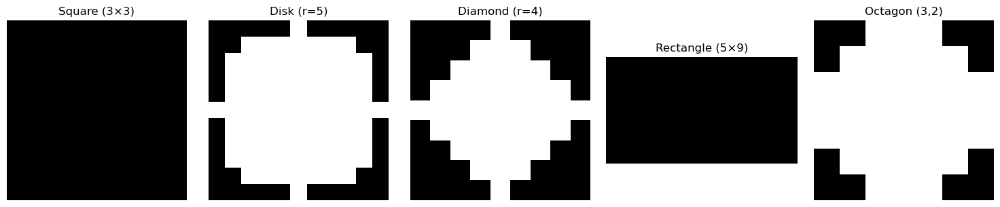

In [25]:
import matplotlib.pyplot as plt
from skimage.morphology import square, disk, diamond, rectangle, octagon

SEs = [
    ("Square (3×3)", square(3)),
    ("Disk (r=5)", disk(5)),
    ("Diamond (r=4)", diamond(4)),
    ("Rectangle (5×9)", rectangle(5, 9)),
    ("Octagon (3,2)", octagon(3, 2)),
]

fig, axes = plt.subplots(1, len(SEs), figsize=(15, 3))
for ax, (title, se) in zip(axes, SEs):
    ax.imshow(se, cmap="gray")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()



## 🧭 Rule of Thumb for Structuring Elements (SEs)

* **Cross (plus-shaped SE)**

  * Connectivity only through **N, S, E, W neighbors**.
  * Very **conservative** — useful when you don’t want diagonal connections.
  * In binary images: objects touch **only if they share an edge**, not a corner.
  * Good for skeletonization or cautious noise cleanup.

* **Square / Diamond**

  * Both expand connectivity beyond the cross, but differently:

    * **Square** → includes diagonal neighbors; stronger smoothing and more aggressive filling.
    * **Diamond** → like a square, but with “corner pixels shaved off” → more natural balance.
  * Radius determines the **strength of pruning or filling**.

* **Disk**

  * **Isotropic** (round) → treats all directions equally.
  * Great for **natural/biological shapes** (cells, nuclei, brain regions).
  * Less biased than square/diamond when objects are curved.

* **Ball (3D)**

  * The 3D analogue of the disk.
  * Used for MRI, CT, fMRI, or 3D microscopy stacks.
  * Ensures isotropic processing in all directions (X, Y, Z).
  * Example: `ball(3)` → spherical structuring element of radius 3 voxels.

---

✅ **Takeaway**:

* Choose **cross** when you want strict edge connectivity.
* Choose **square/diamond** for fast, simple cleanup (but watch for anisotropy).
* Choose **disk/ball** for natural shapes (cells, brains, vessels) where orientation should not matter.

---

## 1) toy-but-realistic image: Shepp–Logan phantom (+ salt & pepper)

(400, 400)


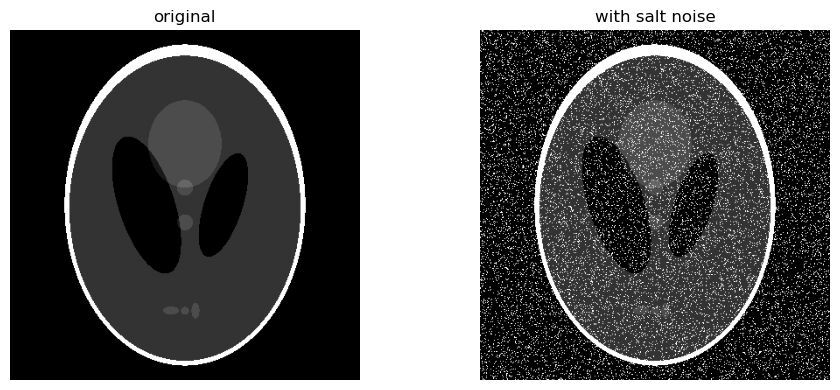

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from skimage.morphology import erosion, dilation, opening, closing, disk

shepp_logan = data.shepp_logan_phantom()   # float image in [0,1], 400x400 (usually)
H, W = shepp_logan.shape
print(shepp_logan.shape)

# add simple salt noise (random white specks);
# for textbook-style: add {0,1} booleans and clip to [0,1]
rng = np.random.default_rng(0)
noise_mask = rng.random((H, W)) < 0.10        # 10% white specks
noisy = np.clip(shepp_logan + noise_mask.astype(float), 0, 1)

fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(shepp_logan, cmap="gray"); ax[0].set_title("original"); ax[0].axis("off")
ax[1].imshow(noisy, cmap="gray");       ax[1].set_title("with salt noise"); ax[1].axis("off")
plt.tight_layout(); plt.show()

## 2) 🌱 Morphological Basics: Erosion vs. Dilation

Morphology works on **shapes** in an image, using a **structuring element (SE)** (footprint, e.g. cross, square, disk).
The SE moves over the image, and the pixel is replaced depending on the neighborhood:

---

## 🟦 Erosion (shrinks bright objects)

* Think of it as **wearing away** the edges of bright shapes.
* Rule: A pixel stays bright **only if all pixels under the SE are bright**.
* Effect:

  * Removes **small bright noise** (like isolated pixels or thin lines).
  * Shrinks larger bright regions (their boundaries move inward).
  * Breaks narrow connections between objects.

👉 Intuition: Imagine **eroding soil with water** – small isolated parts disappear first.

---

## 🟩 Dilation (expands bright objects)

* Think of it as **growing or thickening** bright shapes.
* Rule: A pixel becomes bright **if at least one pixel under the SE is bright**.
* Effect:

  * Fills small dark holes/gaps in objects.
  * Thickens lines, expands regions outward.
  * Can connect nearby objects if they’re within the SE’s reach.

👉 Intuition: Imagine **dropping ink on blotting paper** – it spreads outward.

---

## 🔄 Relationship

* **Erosion and dilation are opposites**:

  * Erosion makes things smaller.
  * Dilation makes things larger.
* But they’re **not exact inverses** → applying erosion then dilation ≠ original image (that’s called **opening**, used for noise removal).

---

## 📌 With a Cross SE (N,S,E,W connectivity):

* **Erosion** → thins objects only along those 4 directions.
* **Dilation** → expands objects only in those directions.
* More conservative than a square or disk SE (less aggressive smoothing).

---

✅ Quick analogy:

* **Erosion** = “shrink / prune / thin”.
* **Dilation** = “grow / thicken / spread”.

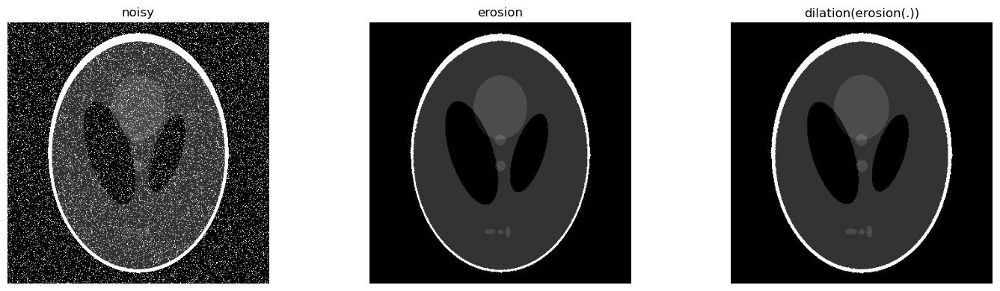

In [21]:
cross = np.array([[0,1,0],
                  [1,1,1],
                  [0,1,0]], dtype=np.uint8)

eroded  = erosion(noisy,  footprint=cross)
dilated = dilation(eroded, footprint=cross)   # erosion followed by dilation

fig, ax = plt.subplots(1, 3, figsize=(15,4))
ax[0].imshow(noisy,  cmap="gray"); ax[0].set_title("noisy");   ax[0].axis("off")
ax[1].imshow(eroded, cmap="gray"); ax[1].set_title("erosion"); ax[1].axis("off")
ax[2].imshow(dilated,cmap="gray"); ax[2].set_title("dilation(erosion(.))"); ax[2].axis("off")
plt.tight_layout(); plt.show()

**what you’ll see**

* erosion **cleans** salt noise but also **thins** bright structures (e.g., skull ring); dark ventricles slightly expand.
* dilation after erosion **restores** thickness while keeping the noise gone.

---

## 3) 🔄 Opening & Closing (with larger, isotropic SEs like a **disk**)

Morphological **opening** and **closing** are combinations of **erosion** and **dilation**, designed to **clean up images** while keeping the overall shape of larger objects.

---

## 🟦 Opening = erosion → dilation

* **Step 1: Erosion** removes small bright spots/noise.
* **Step 2: Dilation** restores the size of the remaining bright objects.

👉 Net effect:

* Eliminates **tiny bright specks** and **thin protrusions**.
* Keeps **larger bright structures** intact.
* Good for denoising binary masks or removing spurious activations in MRI/fMRI.

📌 Analogy: Think of brushing sandpaper lightly over a bumpy surface → little bumps are shaved off, but the big object stays.

---

## 🟩 Closing = dilation → erosion

* **Step 1: Dilation** fills in tiny dark gaps and connects nearby objects.
* **Step 2: Erosion** restores the outer shape of the objects.

👉 Net effect:

* Removes **small dark holes** inside objects.
* Bridges **narrow dark gaps** between objects.
* Useful for closing cerebrospinal-fluid-like gaps or filling tiny missing pixels in brain masks.

📌 Analogy: Think of pouring plaster → it fills tiny cracks, then the surface is smoothed back.

---

## 🌍 Why “bigger, isotropic SE”?

* Using a **disk (2D)** or **ball (3D)** structuring element makes opening/closing **rotation-invariant** → treats all directions equally.
* A **larger SE** targets **coarser features** (removes or fills bigger regions), while a smaller SE affects only fine details.

---

✅ Quick summary:

* **Opening** → good for removing **small bright noise** while preserving bigger structures.
* **Closing** → good for **filling small dark holes** or gaps.

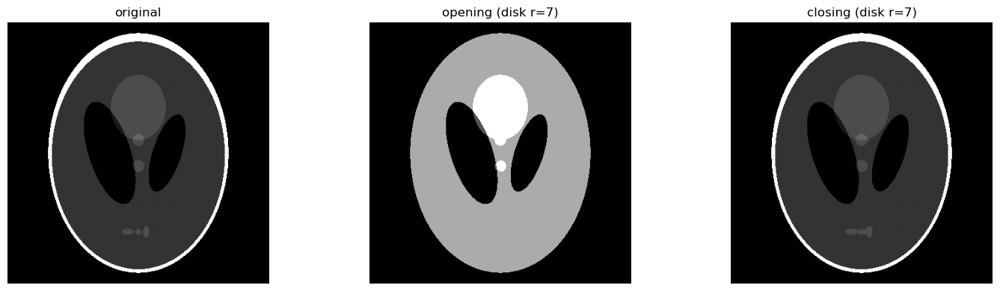

In [22]:
big_disk = disk(7)  # larger, isotropic footprint

opened = opening(shepp_logan, footprint=big_disk)
closed = closing(shepp_logan, footprint=big_disk)

fig, ax = plt.subplots(1, 3, figsize=(15,4))
ax[0].imshow(shepp_logan, cmap="gray"); ax[0].set_title("original"); ax[0].axis("off")
ax[1].imshow(opened,      cmap="gray"); ax[1].set_title("opening (disk r=7)"); ax[1].axis("off")
ax[2].imshow(closed,      cmap="gray"); ax[2].set_title("closing (disk r=7)"); ax[2].axis("off")
plt.tight_layout(); plt.show()

**reading**

* opening with a big disk **shrinks/removes the skull ring** and other small bright features while preserving dark ventricles.
* closing **bridges gaps** and thickens bright boundaries, useful for forming connected masks.

---

## 4)  ⚡ Edge-like Signals via Morphology

Morphology isn’t just for smoothing and denoising — it can also be used to extract **edges** (boundaries of objects).
Instead of derivatives (like Sobel, Scharr, Laplace), morphological edges are based on **differences between dilation and erosion**.

---

## 🟨 External Edge

Formula:

$$
\text{Edge}_{\text{external}} = \text{original} - \text{erosion(original)}
$$

* Keeps pixels that are **lost after erosion** → i.e., the **outer boundary** of bright objects.
* Produces edges that are **just outside** the objects.
* Works well when you want a **thin, outer outline**.

👉 Think of “peeling away” the border pixels: what’s removed is exactly the edge.

---

## 🟧 Morphological Gradient

Formula:

$$
\text{Gradient} = \text{dilation(original)} - \text{erosion(original)}
$$

* Captures **both outer and inner boundaries**.
* More **symmetric**: highlights edges on **both sides** of objects.
* Thicker than the external edge.

👉 Think of it as **edge thickness = SE size** → bigger SE, thicker edge.

---

## 📌 Properties vs Classic Filters

* Unlike Sobel/Scharr (derivatives of intensity), morphological edges are **shape-based** (max/min operations).
* Less sensitive to absolute intensity gradients, more to **object boundaries**.
* Useful in **binary masks** (segmentations), but can also apply to grayscale.

---

## 🧠 In Neuroscience

* External edge → to **outline segmented brain regions** (e.g., cortex mask boundary).
* Morphological gradient → to emphasize **interfaces between gray/white matter or CSF**.
* Robust in binary preprocessing pipelines (after thresholding or region labeling).

---

✅ Quick Summary:

* **External edge**: outer contour only (thin).
* **Morphological gradient**: both sides of boundary (thicker).

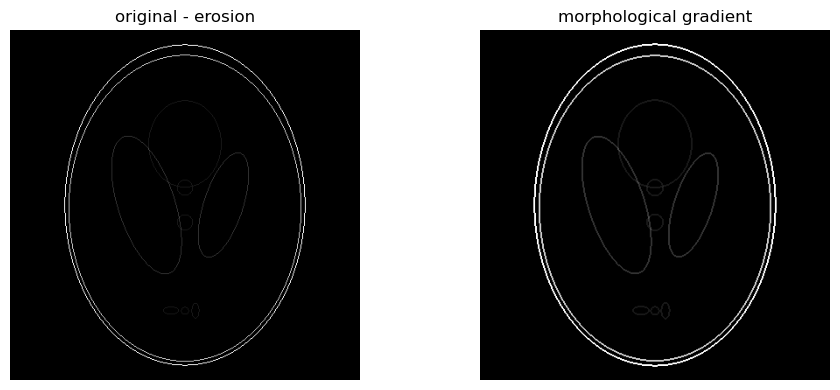

In [23]:
edge_ext = shepp_logan - erosion(shepp_logan, footprint=cross)

grad = dilation(shepp_logan, footprint=cross) - erosion(shepp_logan, footprint=cross)

fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(edge_ext, cmap="gray"); ax[0].set_title("original - erosion"); ax[0].axis("off")
ax[1].imshow(grad,     cmap="gray"); ax[1].set_title("morphological gradient"); ax[1].axis("off")
plt.tight_layout(); plt.show()

# 🎩 5) Top-Hat Transforms (Small-Feature Enhancement)

Top-hat transforms are **morphological contrast tools** that enhance **small structures** relative to the background.
They compare the original image with its **opening** or **closing**.

---

## 🟨 White Top-Hat (a.k.a. Top-Hat Transform)

$$
\text{White Top-Hat} = \text{image} - \text{opening(image)}
$$

* **Opening** removes small bright objects.
* Subtracting that from the original leaves only the **removed small bright features**.
* Highlights:

  * Small bright **spots, ridges, or details** on a darker background.
  * Useful for detecting **cells, micro-bleeds, tiny bright vessels** in microscopy or MRI.

👉 Analogy: Imagine sanding a rough surface (opening removes bumps) → the leftover “shaved bumps” are what the white top-hat shows.

---

## 🟩 Black Top-Hat (a.k.a. Bottom-Hat Transform)

$$
\text{Black Top-Hat} = \text{closing(image)} - \text{image}
$$

* **Closing** fills small dark gaps.
* Subtracting the original leaves only the **filled dark regions**.
* Highlights:

  * Small **dark holes, pits, or cracks** inside brighter objects.
  * Useful for finding **tiny lesions, sulci, or vascular shadows** in brain imaging.

👉 Analogy: Pouring plaster into tiny cracks (closing fills gaps) → the “plaster-only parts” are what the black top-hat shows.

---

## 📊 Properties

* **Structuring element (SE) size matters**:

  * Small SE → enhances **fine details**.
  * Large SE → enhances **larger features**.
* Can be applied to both **binary** and **grayscale** images.
* Works like a **feature detector** that is **shape-dependent**.

---

## 🧠 Neuroscience Applications

* **White top-hat**: highlight **small bright anomalies** (micro-calcifications, small white-matter hyperintensities).
* **Black top-hat**: highlight **small dark gaps** (microbleeds, vessel shadows, cortical sulci).
* Useful in preprocessing pipelines to **enhance subtle but important structures** before segmentation or classification.

---

✅ Quick summary:

* **White top-hat** = extract **small bright structures**.
* **Black top-hat** = extract **small dark structures**.
* Both depend heavily on the chosen **structuring element size & shape**.


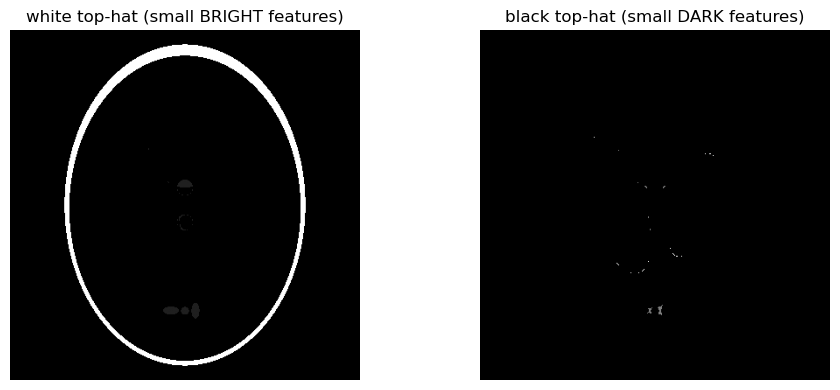

In [24]:
def white_tophat(img, footprint):
    return img - opening(img, footprint=footprint)

def black_tophat(img, footprint):
    return closing(img, footprint=footprint) - img

wth = white_tophat(shepp_logan, big_disk)
bth = black_tophat(shepp_logan, big_disk)

fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(wth, cmap="gray"); ax[0].set_title("white top-hat (small BRIGHT features)"); ax[0].axis("off")
ax[1].imshow(bth, cmap="gray"); ax[1].set_title("black top-hat (small DARK features)");  ax[1].axis("off")
plt.tight_layout(); plt.show()

**intuition**

* the **footprint size** defines what “small” means. larger SE → only *tiny* features survive the top-hat.

---

## 6) 3D Brains (fMRI / Structural MRI): Using 3D Structuring Elements (SEs)

When working with neuroimaging data (fMRI, anatomical MRI, diffusion MRI), we are usually dealing with **3D or 4D volumes**:

* **3D structural MRI** → one intensity per voxel.
* **4D fMRI** → a time series of 3D volumes (space × time).

Morphological operations (erosion, dilation, opening, closing) can be applied in **3D space** to clean masks, smooth regions, or remove noise. To do this isotropically (equally in all directions), we use **3D structuring elements (SEs)** shaped like spheres.

---

### What is `ball(r)`?

In `scikit-image`, the function:

```python
from skimage.morphology import ball
selem = ball(r)
```

returns a **3D, binary structuring element**:

* Shape: **sphere** of radius `r` (measured in voxels).
* Values: `1` (inside or on the sphere), `0` (outside).
* Dimensionality: `(2r+1, 2r+1, 2r+1)` cube containing the sphere.

This is different from:

When creating 3D structuring elements (`skimage.morphology`), you have different distance metrics:

* **`cube(r)`** → All voxels within a *Chebyshev distance* ≤ `r` are included.
  *Looks like a blocky cube.*
  → Expands equally along axes only, so diagonals are “fatter.”

* **`octahedron(r)`** → All voxels within a *Manhattan distance* ≤ `r` are included.
  *Looks like a diamond (pointy).*
  → Grows faster along axis-aligned directions, less along diagonals.

* **`ball(r)`** → All voxels within a *Euclidean distance* ≤ `r` are included.
  *Looks like a true sphere.*
  → Every direction (x, y, z) is treated equally — **isotropic**.

---

👉 **Direct takeaway:**

* Use `cube` if you want axis-aligned growth.
* Use `octahedron` if you want diamond-like growth (Manhattan metric).
* Use `ball` for real 3D isotropic growth — best for brain volumes.

---

### Why is isotropy important in neuroimaging?

Brains are 3D structures. If you use a 2D SE (like a disk) slice-by-slice, you risk introducing artificial anisotropy (different treatment along z vs x/y). Using a **ball** ensures operations are applied consistently in all three spatial directions, preserving the geometry of brain regions.

Example uses:

* **Opening** with `ball(r)`: removes small bright clusters (radius < \~r voxels), smooths protrusions.
* **Closing** with `ball(r)`: fills small dark gaps/holes (< \~r voxels), smooths indentations.
* **Erosion / dilation**: shrink or expand binary masks (ROIs, segmentations) uniformly.

---

### Voxels vs. Millimeters

⚠️ Important caveat in MRI/fMRI: voxel spacing is often **anisotropic**.

* Example: `2.0 × 2.0 × 3.0 mm` voxels.
* A `ball(r)` in voxel units is **not a true sphere in physical space**—it’s stretched along the axis with different voxel size.

solutions:

1. **Resample the image** to isotropic voxel spacing (e.g., 2×2×2 mm).


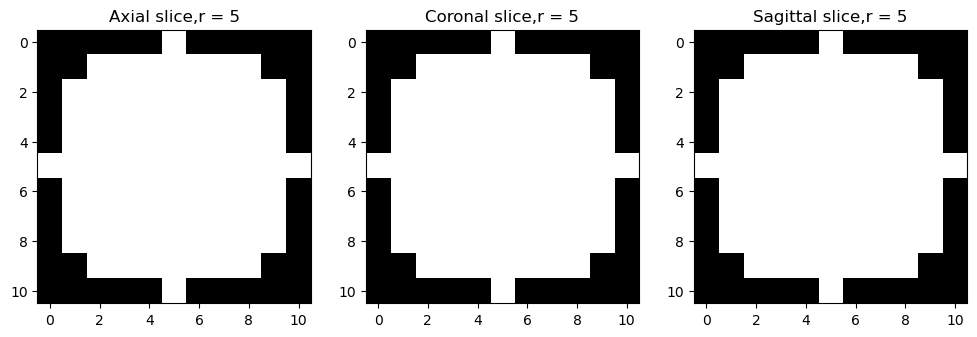

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import ball

r = 5
selem = ball(r)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(selem[r,:,:], cmap="gray")  # axial
axes[0].set_title("Axial slice,r = 5")

axes[1].imshow(selem[:,r,:], cmap="gray")  # coronal
axes[1].set_title("Coronal slice,r = 5")

axes[2].imshow(selem[:,:,r], cmap="gray")  # sagittal
axes[2].set_title("Sagittal slice,r = 5")

plt.show()



### B. 3D voxel view (to “feel” the sphere)

Sometimes it’s easier to see the structuring element in **3D** rather than as 2D slices.
You can plot it as:

1. **Scatter plot** → dots for all voxels inside the sphere.
2. **Voxel plot** → solid cubes for each voxel (heavier, but feels more “real”).

Here’s both options:

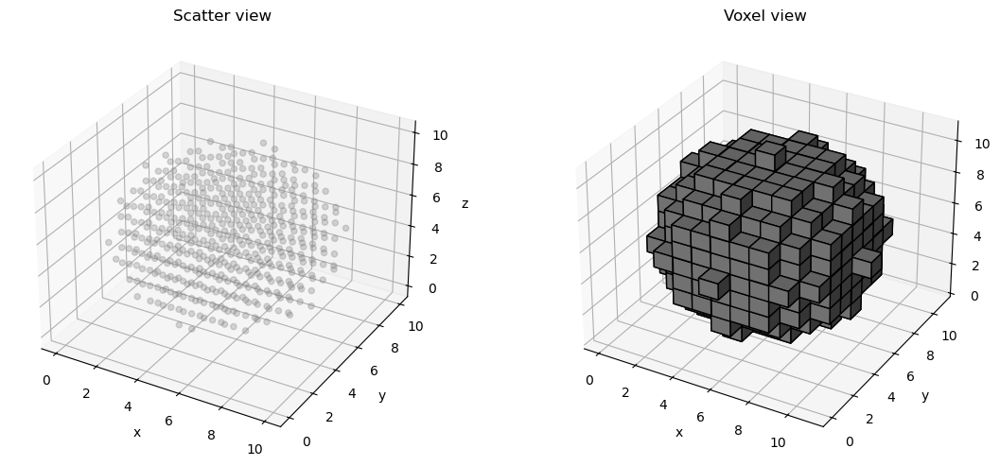

In [29]:
import matplotlib.pyplot as plt
from skimage.morphology import ball

# Create a ball of radius r
r = 5
B = ball(r)

# Option 1: scatter plot
xs, ys, zs = B.nonzero()

fig = plt.figure(figsize=(12,5))

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(xs, ys, zs, alpha=0.3, s=20, c='gray')
ax1.set_title("Scatter view")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_zlabel("z")

# Option 2: voxel plot (solid cubes)
ax2 = fig.add_subplot(122, projection='3d')
ax2.voxels(B, facecolors='gray', edgecolor='k')
ax2.set_title("Voxel view")
ax2.set_xlabel("x")
ax2.set_ylabel("y")
ax2.set_zlabel("z")

plt.tight_layout()
plt.show()




---

## 6.2) Why radius matters (mini demo on a synthetic “lesion”)

**What radius `r` does (with `ball(r)`):**

* **Opening (erode→dilate):** removes thin/bright bits whose **thickness ≲ r**. Small spurs and salt-noise vanish; big structures remain.
* **Closing (dilate→erode):** fills dark gaps/holes whose **diameter ≲ r**. Small cavities get sealed; large ones stay.
* **Isotropic:** using a **ball** (Euclidean) treats x/y/z the same, so effects are uniform across slices.

**How to choose `r`:**

* Pick `r` slightly **larger** than the unwanted artifact’s radius (spur, speckle) for opening.
* Pick `r` slightly **larger** than the hole’s radius for closing.
* Remember `r` is in **voxels**. If voxel sizes are anisotropic (e.g., 2×2×3 mm), resample to isotropic .

---

### Mini demo (ready to run)

* Builds a 3D “lesion” with small **bright spurs** and **dark holes**.
* Applies opening/closing with `ball(r)` for `r ∈ {1,2,3,4}`.
* Shows center-slice montages so you see spurs/holes disappear as `r` grows.

 it produces three figures:

 Original vs Noisy, 2) Opening results across `r`, 3) Closing results across `r`.


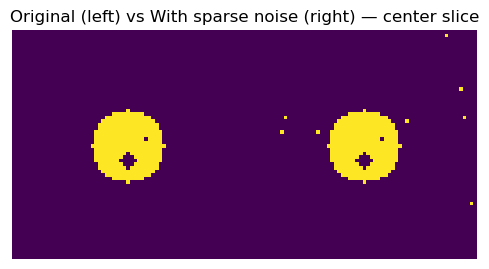

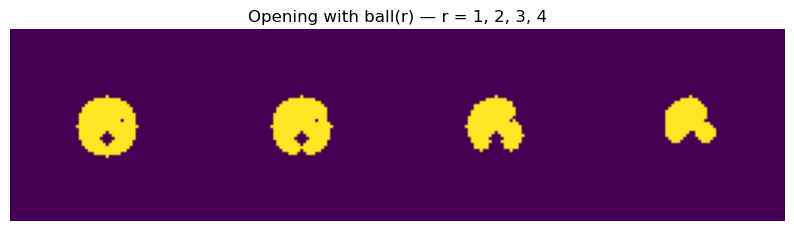

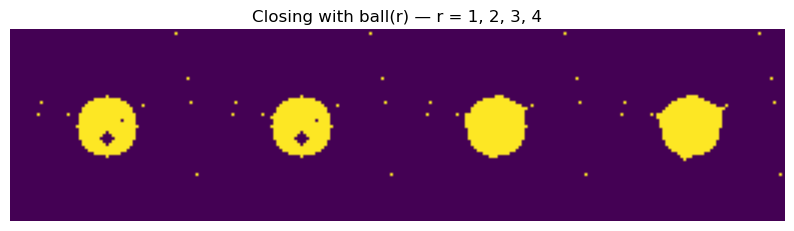

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import ball, binary_opening, binary_closing

# --- build a 3D synthetic "lesion" with bright spurs + dark holes ---
np.random.seed(0)
N = 64
vol = np.zeros((N, N, N), dtype=bool)

def draw_sphere(arr, cx, cy, cz, r, value=True):
    x = np.arange(arr.shape[0])[:, None, None]
    y = np.arange(arr.shape[1])[None, :, None]
    z = np.arange(arr.shape[2])[None, None, :]
    mask = (x - cx)**2 + (y - cy)**2 + (z - cz)**2 <= r**2
    arr[mask] = value

center = (N//2, N//2, N//2)
draw_sphere(vol, *center, r=10, value=True)                       # base lesion
for dx,dy,dz in [(8,0,0), (-7,2,0), (0,-8,3), (3,4,-7)]:          # bright spurs
    draw_sphere(vol, center[0]+dx, center[1]+dy, center[2]+dz, r=2, value=True)
for dx,dy,dz in [(4,0,0), (0,-3,4), (-2,5,-2)]:                   # dark holes
    draw_sphere(vol, center[0]+dx, center[1]+dy, center[2]+dz, r=2, value=False)

noise = np.random.rand(N, N, N) < 0.002                           # sparse salt noise
vol_noisy = vol | noise

# --- run opening/closing with different radii ---
r_list = [1, 2, 3, 4]
opened = [binary_opening(vol_noisy, footprint=ball(r)) for r in r_list]
closed = [binary_closing(vol_noisy, footprint=ball(r)) for r in r_list]

# --- make simple montages of the center slice (one plot per figure) ---
z0 = N // 2
def montage(rows):
    gap = np.zeros((rows[0].shape[0], 1), dtype=bool)
    out = []
    for i, r in enumerate(rows):
        out.append(r.astype(bool))
        if i < len(rows)-1: out.append(gap)
    return np.concatenate(out, axis=1)

orig_m = np.concatenate([vol[:,:,z0], np.zeros((N,2),bool), vol_noisy[:,:,z0]], axis=1)
open_m = montage([o[:,:,z0] for o in opened])
close_m = montage([c[:,:,z0] for c in closed])

plt.figure(figsize=(6,6));  plt.title("Original (left) vs With sparse noise (right) — center slice")
plt.imshow(orig_m);  plt.axis("off");  plt.show()

plt.figure(figsize=(10,6)); plt.title("Opening with ball(r) — r = " + ", ".join(map(str, r_list)))
plt.imshow(open_m); plt.axis("off"); plt.show()

plt.figure(figsize=(10,6)); plt.title("Closing with ball(r) — r = " + ", ".join(map(str, r_list)))
plt.imshow(close_m); plt.axis("off"); plt.show()


### **Figure 1: Original (left) vs Noisy (right)**

* **Left:** A clean synthetic “lesion” (yellow = voxels inside lesion, purple = background).

  * It’s a roughly spherical structure with **small dark cavities (holes)** inside.
* **Right:** Same lesion **plus noise** (random bright specks scattered outside).

  * This simulates MRI artifacts or thresholding noise in real neuroimaging masks.
  * The lesion shape is the same, but there are now **spurious tiny bright dots** that should ideally be cleaned.

---

### **Figure 2: Opening with `ball(r)`**

This shows the **effect of increasing radius `r`** during **opening** (erosion → dilation):

* **r=1:**

  * Smallest radius → removes only the tiniest specks.
  * Lesion remains almost unchanged.
* **r=2:**

  * Removes slightly larger bright protrusions/spurs.
  * The lesion edges become smoother.
* **r=3:**

  * Erodes away noticeable parts of the lesion, leaving only the more compact core.
  * Narrow bridges or spurs vanish.
* **r=4:**

  * Strong opening → lesion shrinks dramatically.
  * Only the central bulk remains; small/medium features are erased.

👉 **Lesson:** As `r` increases, **opening progressively deletes features smaller than \~r voxels**, while preserving larger structures.

---

### **Figure 3: Closing with `ball(r)`**

This shows the **effect of increasing radius `r`** during **closing** (dilation → erosion):

* **r=1:**

  * Fills only the tiniest dark holes (e.g., single-voxel gaps).
  * Overall shape unchanged.
* **r=2:**

  * Slightly larger cavities inside the lesion start to close.
  * Small indentations on the surface are smoothed out.
* **r=3:**

  * Most of the inner holes are filled in completely.
  * Lesion looks more solid.
* **r=4:**

  * Large-scale smoothing → lesion becomes more rounded and uniform.
  * Even bigger cavities vanish, and small concavities at the border are filled.

👉 **Lesson:** As `r` increases, **closing progressively fills in dark gaps up to radius \~r**, making structures more compact and solid.

---

### **Key Neuroimaging Takeaway**

* **Opening** with `ball(r)` → Good for **removing small bright noise** or spurious activations in fMRI masks.
* **Closing** with `ball(r)` → Good for **filling small dark holes** in ROIs (regions of interest), e.g., brain tissue masks.
* **Radius selection matters:**

  * Too small → doesn’t clean/fill enough.
  * Too large → destroys real features.
  * Choose `r` based on the **physical size of noise/artifact vs. brain structures** (convert voxels → mm if needed).

---

## 6.3) Anisotropic voxels: when `ball` is *not* physically spherical

If your voxel spacing is **anisotropic** (e.g., `2.0 × 2.0 × 3.0 mm`), a `ball(r)` is spherical **in voxels** but **not in millimeters**.
**Fix**: resample the image to **isotropic voxels** (e.g., `2 mm` or `1 mm`) and then use `ball(r_mm / voxel_size_mm)`.

### Quick rules

* **Choose target spacing**: 2 mm is common for fMRI; 1 mm for high-res structural MRI.
* **Interpolation**:

  * **Intensity images** (T1, EPI): **linear** (a.k.a. “continuous”).
  * **Labels/masks** (GM/WM, ROIs): **nearest** (avoids new label IDs and soft edges).
* **Anti-aliasing** (when **downsampling** to larger voxels): light Gaussian blur first helps prevent stair-step aliasing.
* **4D fMRI**: resample **spatial dims only** (x,y,z), keep time as-is.


> `ellipsoid` creates a **3D anisotropic** footprint; use it when voxel sizes differ.

---

## 6.4) Choosing `ball(r)` in neuro pipelines (rules of thumb)

* **Binary masks** (brain, ROIs):

  * *Opening* with small `r` removes speckles/bridges; *Closing* seals pinholes/gaps.
  * Start with **r = 1–2 voxels**; increase only if artifacts persist.
* **fMRI preprocessing**:

  * Use morphology mostly on **masks** (brain/skull-strip, tissue segmentation), not on raw BOLD time series.
  * Prefer **3D footprints** (`ball/ellipsoid`) over slice-wise 2D to avoid slicewise artifacts.
* **Pick r by feature scale**:

  * If you want to remove structures ≲ 2 voxels across, choose `ball(r=2)`; to fill a \~3-voxel hole, `closing` with `ball(r≥3)`.

---

## 6.5) Quick “feel” for size: how many voxels are in `ball(r)`?

In [36]:
for r in range(1, 6):
    B = ball(r)
    print(f"r={r:>2} -> voxels in ball: {B.sum()}")

r= 1 -> voxels in ball: 7
r= 2 -> voxels in ball: 33
r= 3 -> voxels in ball: 123
r= 4 -> voxels in ball: 257
r= 5 -> voxels in ball: 515


This helps calibrate how aggressive your SE is.

---

### TL;DR

* **`ball(r)`** = 3D, Euclidean, isotropic SE of radius `r` **in voxels**.
* Use it with **opening/closing** to prune or heal features up to roughly **size r**.
* For **anisotropic voxel spacing**, switch to an **ellipsoid** or resample to isotropic.
* Always visualize orthogonal slices to confirm the effect matches your intention.


**neuro implications**

* **opening** can **remove thin skull/meninges** or spurious bright speckles in masks.
* **closing** can **bridge small gaps** in brain masks or ROIs.
* always prefer **3D footprints** (ball) instead of slice-wise 2D ones to avoid staircasing artifacts.

---

## practical tips & pitfalls

* **choose footprint carefully**: size & shape encode your prior about the object’s scale and connectivity.
* **morphology is non-linear**: intensities aren’t preserved (unlike averaging); validate against your analysis goals.
* **order matters**: opening ≠ closing; pick the one that matches your need (remove bright specks vs fill dark gaps).
* **combine with thresholds**: often used after a threshold or segmentation to clean masks (remove small components, fill holes).
* **in fMRI**: use morphology mostly on **masks** (brain, tissue, ROIs) rather than raw BOLD time series.

---

### quick exercise ideas (from the text)

1. implement **white/black top-hat** (done above) and explore with different footprints (disk/square/diamond).
2. try morphological ops on the **brain slice** from earlier (Gaussian demo). can you remove skull remnants with opening? what small brain structures do you lose? try **3D** opening with `ball(r)`—it usually preserves shapes better than slice-wise 2D.

# **Bonus**


#  Padding — why we need it, types, and their effects

## Why padding?

When a kernel (e.g., 3×3) sits on a border pixel, some neighbors would fall **outside** the image. Padding adds a border so the kernel always has values to multiply with. This:

* lets us keep the **same output size** as input (“same” convolution),
* avoids **throwing away** border pixels,
* encodes an **assumption** about what the image looks like beyond its edges (this choice matters!).

### Common padding modes & their assumptions

* **Zero / constant**: outside is all zeros → can create dark “halos” at borders.
* **Edge / replicate**: continue the nearest pixel → flat plateaus at borders.
* **Reflect / mirror**: mirror the image at the edge → preserves continuity/slope; good default for natural images.
* **Wrap / circular**: left edge connects to right, top to bottom → for periodic signals/textures.

### Visualize padding (1×4 subplots)


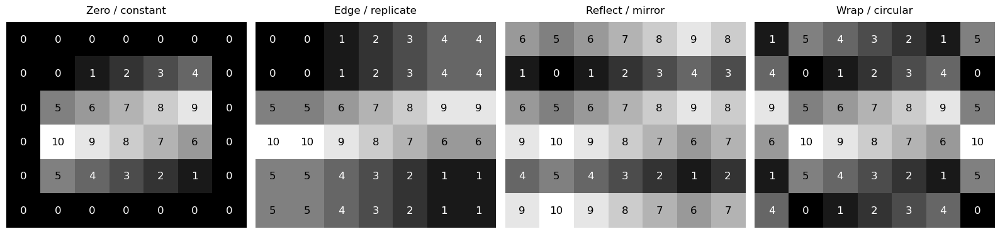

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Small toy image (4x5) so values are easy to see
small_image = np.concatenate([np.arange(10), np.arange(10, 0, -1)]).reshape((4, 5))

padw = 1  # one-pixel padding

p_zero = np.pad(small_image, padw, mode="constant", constant_values=0)
p_edge = np.pad(small_image, padw, mode="edge")
p_ref  = np.pad(small_image, padw, mode="reflect")
p_wrap = np.pad(small_image, padw, mode="wrap")

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
imshow_with_annot(p_zero, ax=axes[0], fmt="{:.0f}", title="Zero / constant")
imshow_with_annot(p_edge, ax=axes[1], fmt="{:.0f}", title="Edge / replicate")
imshow_with_annot(p_ref,  ax=axes[2], fmt="{:.0f}", title="Reflect / mirror")
imshow_with_annot(p_wrap, ax=axes[3], fmt="{:.0f}", title="Wrap / circular")
plt.tight_layout(); plt.show()

### How padding changes a convolution result

Below we convolve the toy image with a simple **mean (box) kernel** and compare the outputs across pad modes.

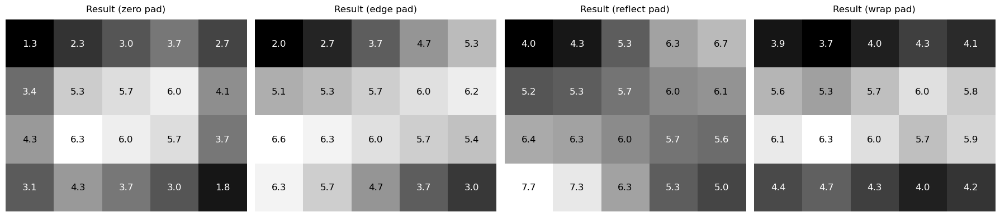

In [5]:
# 3x3 mean (box) kernel
box = np.ones((3,3), dtype=float) / 9.0

import numpy as np

def conv2d_same(img, kernel, pad_mode="constant", cval=0.0):
    """
    Naive 2D convolution (single channel), SAME size, with chosen padding.

    pad_mode: 'constant', 'edge', 'reflect', 'wrap', ... (NumPy pad modes)
    cval:     only used when pad_mode == 'constant'
    """
    img = np.asarray(img)
    kernel = np.asarray(kernel, dtype=float)

    kh, kw = kernel.shape
    assert kh % 2 == 1 and kw % 2 == 1, "Use odd kernel sizes."
    ph, pw = kh // 2, kw // 2  # padding on top/bottom, left/right

    # Apply padding correctly for each mode
    if pad_mode == "constant":
        padded = np.pad(img, ((ph, ph), (pw, pw)),
                        mode="constant", constant_values=cval)
    else:
        padded = np.pad(img, ((ph, ph), (pw, pw)), mode=pad_mode)

    out = np.zeros_like(img, dtype=float)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            neigh = padded[i:i+kh, j:j+kw]
            out[i, j] = np.sum(neigh * kernel)
    return out


r_zero = conv2d_same(small_image, box, pad_mode="constant", cval=0.0)
r_edge = conv2d_same(small_image, box, pad_mode="edge")
r_ref  = conv2d_same(small_image, box, pad_mode="reflect")
r_wrap = conv2d_same(small_image, box, pad_mode="wrap")

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
imshow_with_annot(r_zero, ax=axes[0], fmt="{:.1f}", title="Result (zero pad)")
imshow_with_annot(r_edge, ax=axes[1], fmt="{:.1f}", title="Result (edge pad)")
imshow_with_annot(r_ref,  ax=axes[2], fmt="{:.1f}", title="Result (reflect pad)")
imshow_with_annot(r_wrap, ax=axes[3], fmt="{:.1f}", title="Result (wrap pad)")
plt.tight_layout(); plt.show()


**Implications you’ll notice:**

* **Zero** padding pulls down border averages (darker rims).
* **Edge** padding repeats border values → borders look flatter/plateau-like.
* **Reflect** preserves continuity across the boundary → often least biased for natural scenes.
* **Wrap** treats image as periodic → only appropriate if that’s true (e.g., tiled textures).



---


# **TASKS**

# 🟢 Task 1 — Images are arrays (neuro template)

**Goal**
Understand how **spatial arrangement** (not just pixel values) carries meaning in neuroimages.

**Dataset (no network needed)**
`nilearn.datasets.load_mni152_template()` → 3D MNI152 T1.

### What to do

1. **Load** the MNI152 T1 and extract the **mid-axial** slice (Z = middle).
2. **Report** the slice’s `shape`, `dtype`, and **intensity range** (min/max).
3. **Shuffle** the slice’s pixels with a fixed RNG seed (e.g., `np.random.default_rng(0)`), then **reshape** back to the original 2D shape.
4. **Display** the **original vs. shuffled** slice **side-by-side** with the same colormap/contrast.
5. (Optional, one line) Print the **mean/std** of both images to notice they are identical or nearly identical.

### Deliverables

* One figure: **Original vs. Shuffled** mid-axial slice.
* A small text printout: `shape`, `dtype`, `min/max`, and optionally `mean/std`.

### Question to answer (3–5 sentences)

**If the original and shuffled slices share essentially the same intensity histogram, why does the shuffled image lose anatomical meaning?**
In your answer, refer to **spatial structure / neighborhood information** (e.g., edges, tissue continuity, sulci/gyri), and explain why neuroimaging analyses (registration, smoothing, segmentation) depend on **spatial correlations** rather than raw intensity values alone.


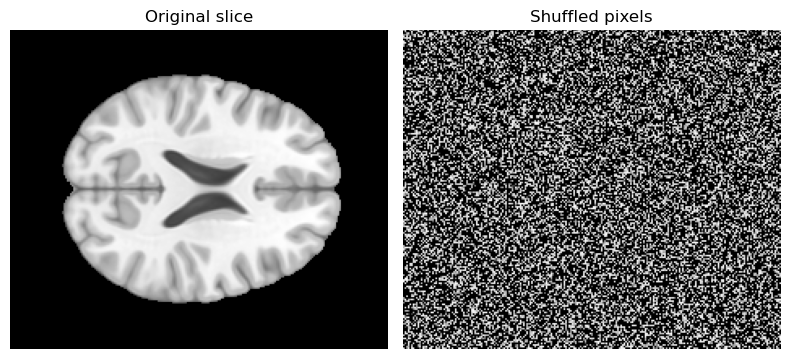

Slice shape: (197, 233) dtype: float64


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, image

# 1) Load MNI152 template directly (bundled in nilearn)
img  = datasets.load_mni152_template()  # returns a Nifti1Image
data = img.get_fdata()                  # shape: (X, Y, Z)

# 2) Take the middle axial slice
z = data.shape[2] // 2
sl = data[:, :, z]

# 3) Shuffle pixels (destroy spatial structure)
flat = sl.ravel().copy()
rng = np.random.default_rng(0)
rng.shuffle(flat)
sl_shuf = flat.reshape(sl.shape)

# 4) Show original vs shuffled
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(sl, cmap='gray', origin='lower')
ax[0].set_title('Original slice'); ax[0].axis('off')
ax[1].imshow(sl_shuf, cmap='gray', origin='lower')
ax[1].set_title('Shuffled pixels'); ax[1].axis('off')
plt.tight_layout(); plt.show()

print("Slice shape:", sl.shape, "dtype:", sl.dtype)




# 🟡 Task 2 — 3D vs 4D neuroimaging 

**Goal:** Distinguish **spatial volumes (3D)** from **time series (4D fMRI)** and relate TR, variance, and visual dynamics.

**Datasets:**

* **3D:** MNI152 template (reuse) → `nilearn.datasets.load_mni152_template()`
* **4D:** **Haxby 2001** fMRI (non-OSF) → `nilearn.datasets.fetch_haxby()`
  *(If downloading fails, use any local 4D BOLD NIfTI.)*

### What to do

1. **3D view:** Plot a **sagittal** slice from the MNI template (e.g., `display_mode='x', cut_coords=[0]`).
2. **Load 4D BOLD:** Load one run, print its **shape** `(X, Y, Z, T)` and **TR** from the header (`img.header.get_zooms()` → last value).
3. **Pick a voxel:** Compute a voxelwise **variance map**; select a **high-variance voxel** and plot its **time series**.
4. **Flipbook:** Show **~6 axial frames** sampled across time to “feel” the 4th dimension (e.g., `t = np.linspace(0, T-1, 6)`).

### Deliverables

* One figure: sagittal MNI slice.
* One plot: high-variance voxel time series.
* One “flipbook” figure: 6 axial frames over time.
* Printout of `(X, Y, Z, T)` and TR.

### Question to answer (3–5 sentences)

**How do the 3D MNI view, the 4D shape/TR, the high-variance time series, and your flipbook together reveal the key differences between spatial structure and temporal dynamics in fMRI?**
Reference specific observations (e.g., estimated TR, signal fluctuations, any visible motion/drift in the flipbook).


BOLD shape: (40, 64, 64, 1452) voxel sizes & TR: (np.float32(3.5), np.float32(3.75), np.float32(3.75), np.float32(2.5))


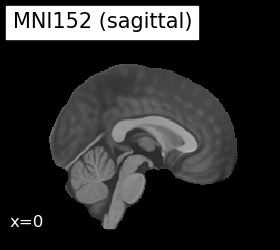

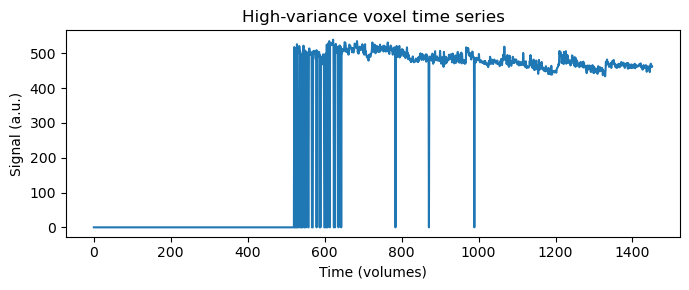

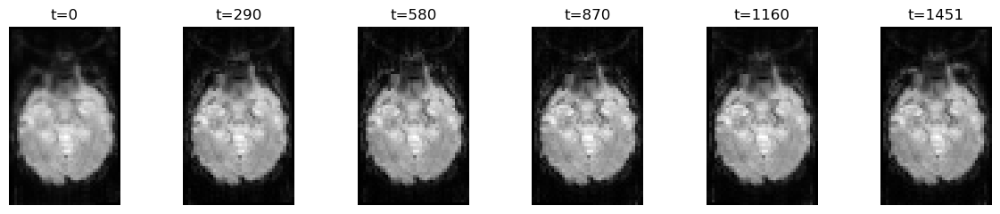

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, image, plotting

# 1) 3D: MNI152 template (sagittal slice at x=0)
t1 = datasets.load_mni152_template()
plotting.plot_anat(t1, display_mode='x', cut_coords=[0], title='MNI152 (sagittal)')

# 2) 4D: Development fMRI (one subject, small dataset)
haxby = datasets.fetch_haxby()
bold_path = haxby.func[0]
img4d = image.load_img(bold_path)
data = img4d.get_fdata()      # shape (X, Y, Z, T)
X, Y, Z, T = data.shape
zooms = img4d.header.get_zooms()  # (dx, dy, dz, TR)
print("BOLD shape:", img4d.shape, "voxel sizes & TR:", zooms)

# 3) Time series of the highest-variance voxel
flat = data.reshape(-1, T)
v_idx = np.argmax(np.var(flat, axis=1))
ts = flat[v_idx]
plt.figure(figsize=(7, 3))
plt.plot(ts)
plt.xlabel('Time (volumes)')
plt.ylabel('Signal (a.u.)')
plt.title('High-variance voxel time series')
plt.tight_layout(); plt.show()

# 4) Flipbook: show a few axial slices over time
idxs = np.linspace(0, T - 1, 6, dtype=int)
z_mid = Z // 2
fig, axes = plt.subplots(1, len(idxs), figsize=(12, 2.5))
for ax, t in zip(axes, idxs):
    vol = image.index_img(img4d, t).get_fdata()
    ax.imshow(vol[:, :, z_mid].T, cmap='gray', origin='lower')
    ax.set_title(f't={t}')
    ax.axis('off')
plt.tight_layout(); plt.show()


In [3]:
flat.shape

(163840, 1452)

In [5]:
v_idx

np.int64(161573)

# 🔵 Task 3 — Filtering & edges on anatomical MRI 

**Goal:** Compare Gaussian smoothing (σ=1, 5) with Sobel/Scharr/Prewitt/Laplace for delineating anatomical boundaries (e.g., the cortical ribbon).

**Dataset (new):** OASIS VBM sample T1s (`nilearn.datasets.fetch_oasis_vbm`). If downloading is heavy, fall back to a mid-axial slice from the MNI template (`datasets.load_mni152_template()`).

### What to do

1. Load one T1 image and select a **mid-axial slice**.
2. Apply **Gaussian smoothing** with **σ = 1** and **σ = 5**.
3. Compute edge maps with **Sobel, Scharr, Prewitt, Laplace** (on the unsmoothed and/or smoothed images).
4. Visually compare results in a grid and note **edge thickness**, **spurious edges** (e.g., in CSF), and **continuity** along sulcal banks.

### Question to answer (write 3–5 sentences)

**Which edge operator (optionally with which Gaussian σ) gives the best trade-off between edge localization and noise suppression for tracing the cortical ribbon—and why?**
Justify using evidence from your outputs (e.g., observed edge thickness, number of false edges in CSF, and continuity of sulcal boundaries) and explicitly state how increasing σ from 1 → 5 changed the outcome.



[fetch_oasis_vbm] Dataset found in C:\Users\Saye\nilearn_data\oasis1


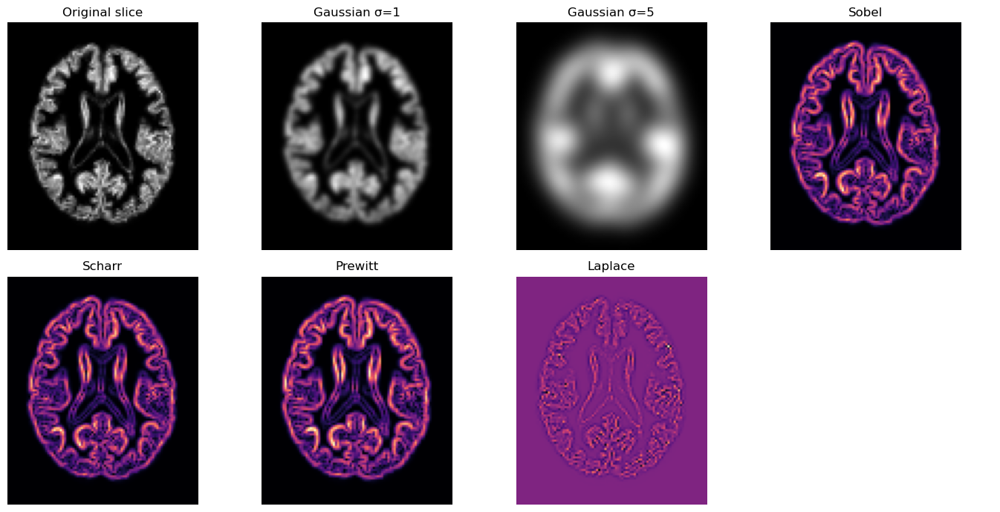

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, image
from skimage import filters

# Try OASIS; if unavailable, comment it out and use MNI.
try:
    oasis = datasets.fetch_oasis_vbm(n_subjects=1)
    t1_img = image.load_img(oasis['gray_matter_maps'][0])  # already in MNI space; float
except Exception:
    icbm = datasets.fetch_icbm152_2009()
    t1_img = image.load_img(icbm['t1'])

arr = t1_img.get_fdata()
z = arr.shape[2] // 2
sl = arr[:, :, z]
sl = (sl - sl.min()) / (np.ptp(sl) + 1e-8)  # normalize 0..1

# Gaussian smoothing
g1 = filters.gaussian(sl, sigma=1)
g5 = filters.gaussian(sl, sigma=5)

# Edges
sob = filters.sobel(sl)
sch = filters.scharr(sl)
pre = filters.prewitt(sl)
lap = filters.laplace(sl, ksize=3)

# Show
fig, ax = plt.subplots(2, 4, figsize=(14, 7))
ax = ax.ravel()
ax[0].imshow(sl.T, cmap='gray', origin='lower'); ax[0].set_title('Original slice'); ax[0].axis('off')
ax[1].imshow(g1.T, cmap='gray', origin='lower'); ax[1].set_title('Gaussian σ=1');   ax[1].axis('off')
ax[2].imshow(g5.T, cmap='gray', origin='lower'); ax[2].set_title('Gaussian σ=5');   ax[2].axis('off')
ax[3].imshow(sob.T, cmap='magma', origin='lower'); ax[3].set_title('Sobel');        ax[3].axis('off')
ax[4].imshow(sch.T, cmap='magma', origin='lower'); ax[4].set_title('Scharr');       ax[4].axis('off')
ax[5].imshow(pre.T, cmap='magma', origin='lower'); ax[5].set_title('Prewitt');      ax[5].axis('off')
ax[6].imshow(lap.T, cmap='magma', origin='lower'); ax[6].set_title('Laplace');      ax[6].axis('off')
ax[7].axis('off')
plt.tight_layout(); plt.show()



# 🔴 Task 4 — Morphological clean-up of fMRI activation masks 

## Objective

Use **morphology** to **denoise and refine** an fMRI activation mask, then **justify** your choices with simple quantitative checks.

## Dataset 

`nilearn.datasets.load_sample_motor_activation_image()`
(Load with `nilearn.image.load_img(...)` if your Nilearn returns a file path.)

## What you’ll practice

* Thresholding a stat map to a **binary mask**
* Applying **opening**, **closing**, and **morphological gradient**
* Balancing **false positives** vs **over-smoothing/merging**
* Reporting **area** (voxel count) and **# connected components**

## Parameters to start with

* Threshold: |Z| > **3.0**
* Noise: **salt-only 2%** (adds false positives without deleting true ones)
* Structuring elements: **opening radius = 2**, **closing radius = 5**

## Step-by-step

1. **Show the stat map** (orthogonal & glass brain) for context.
2. **Select the axial slice** with the **most** suprathreshold voxels (not just the middle).
3. **Threshold** that slice (|Z| > 3.0) to get a binary mask.
4. **Add salt-only noise** (~2%) to simulate spurious activations.
5. **Opening (r=2):** remove isolated speckles while preserving cluster cores.
6. **Closing (r=5):** fill small holes and bridge tiny gaps without over-merging.
7. **Morphological gradient:** visualize the cleaned **boundaries**.
8. **Report metrics** (area & components) for mask → noisy → opening → closing, and **overlay** the closed mask contour on the stat slice.

## What to submit

* A 1×5 (or similar) panel: **Mask** → **Noisy** → **Opening** → **Closing** → **Gradient**, plus an **overlay** (closed mask boundary on stat slice).
* A short **metrics printout/table**: area & components at each stage.
* **3–6 sentences** answering the questions below.

## Questions (answer concisely, using your numbers/figures)

1. **Noise vs. detail:** How did **r=2 opening** vs a larger radius change area/components and visible small clusters?
2. **Over-merging risk:** Did **closing r=5** merge distinct clusters? If yes, how would you mitigate (smaller r, min-component size filtering, distance-based splitting)?
3. **Boundaries:** What did the **gradient** reveal about cluster **shape/edges** that the binary mask alone didn’t?
4. **Slice choice:** Why is choosing the **most informative slice** better than a fixed mid-slice for evaluating morphology?

## Success criteria

* Sensible thresholds/radii (evidence-based, not arbitrary)
* Clear figures (consistent colormaps/scales, readable titles)
* Correct interpretation of **area/components** trends
* Justified trade-offs (denoising vs preserving small true activations)

## Common pitfalls

* Threshold too strict/lenient → empty or noisy masks
* Using big SEs that **over-merge** clusters
* Evaluating only visuals without **reporting metrics**

> Tip: If your mask collapses or explodes, adjust **threshold** (±0.5), **noise %** (1–2%), or **radii** (opening 1–2, closing 4–6) and re-report the metrics.


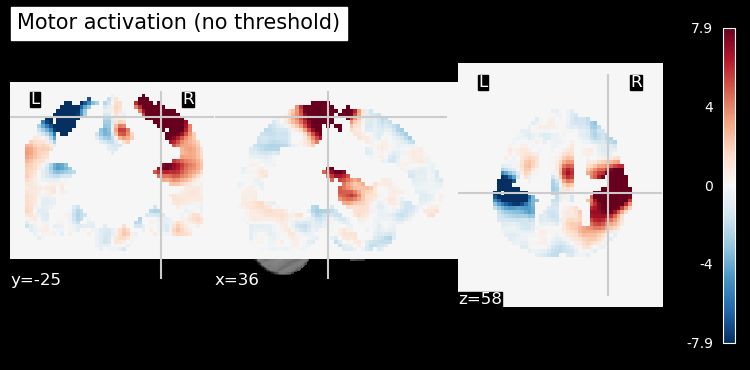

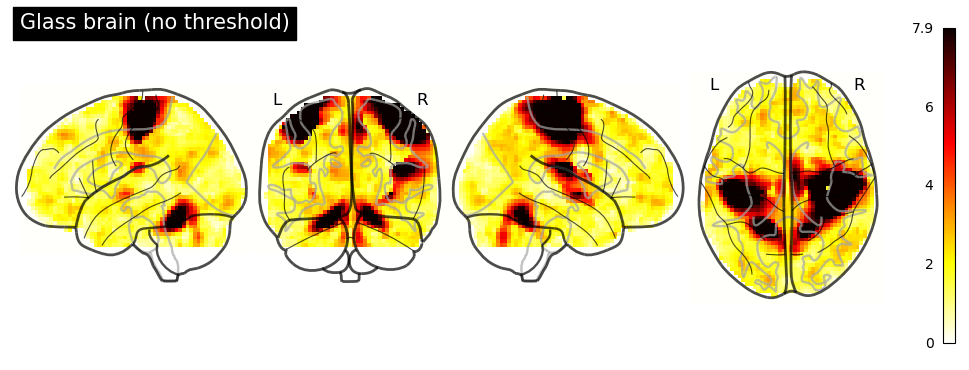

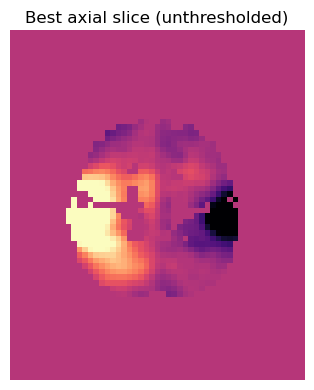

Slice z=38, |Z|>3.0
Mask:   area=255  components=3
Noisy:  area=317 components=56 (salt-only 2%)
Open:   area=196  components=2  (r=2)
Close:  area=209 components=2 (r=5)


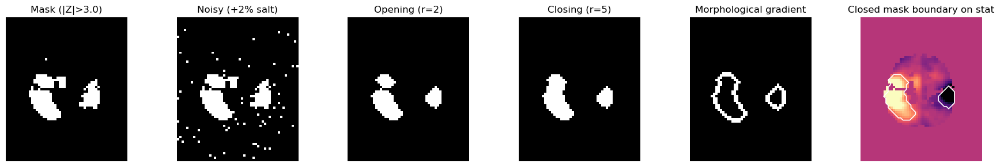

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, image, plotting
from skimage.morphology import (
    disk, binary_opening, binary_closing, binary_dilation, binary_erosion
)
from skimage.measure import label

# -------- params you can tweak --------
THRESH_INIT = 3.0     # initial |Z| threshold
NOISE_P     = 0.02    # fraction of pixels to flip to 1 (salt-only FP)
R_OPEN      = 2       # opening radius (smaller preserves detail)
R_CLOSE     = 5       # closing radius (fills small gaps)

# ---------- 1) load stat map & quick view ----------
stat_path_or_img = datasets.load_sample_motor_activation_image()
stat_img = image.load_img(stat_path_or_img)
bg_img   = datasets.load_mni152_template()

plotting.plot_stat_map(stat_img, bg_img=bg_img, threshold=None,
                       display_mode='ortho', title='Motor activation (no threshold)')
plotting.plot_glass_brain(stat_img, threshold=None, display_mode='lyrz',
                          colorbar=True, title='Glass brain (no threshold)')

stat = stat_img.get_fdata()

# ---------- 2) choose a good slice & threshold ----------
THRESH = THRESH_INIT
mask3d = (np.abs(stat) > THRESH)

# If no voxels survive, relax threshold slightly (simple safeguard)
if mask3d.sum() == 0:
    THRESH = max(2.0, THRESH_INIT - 0.5)
    mask3d = (np.abs(stat) > THRESH)

# Pick the axial slice with the most suprathreshold voxels
z_best = int(np.argmax(mask3d.sum(axis=(0, 1))))
sl_stat = stat[:, :, z_best]
mask = mask3d[:, :, z_best].astype(bool)

# Show the raw stat slice
plt.figure(figsize=(4, 4))
plt.imshow(sl_stat.T, cmap='magma', origin='lower')
plt.title('Best axial slice (unthresholded)'); plt.axis('off')
plt.tight_layout(); plt.show()

# ---------- 3) add SALT-ONLY noise (false positives) ----------
# create NOISE_P fraction of random pixels set to True (on top of the mask)
rng = np.random.default_rng(0)
noisy = mask.copy()
H, W = noisy.shape
n_flip = int(NOISE_P * H * W)
coords = rng.choice(H * W, n_flip, replace=False)
noisy_flat = noisy.ravel()
noisy_flat[coords] = True
noisy = noisy_flat.reshape(H, W)

# ---------- 4) morphology (binary) ----------
opened = binary_opening(noisy, footprint=disk(R_OPEN))   # remove tiny speckles
closed = binary_closing(opened, footprint=disk(R_CLOSE)) # fill gaps / bridge small breaks
grad   = binary_dilation(closed, footprint=disk(1)) ^ binary_erosion(closed, footprint=disk(1))  # boundary

# ---------- 5) metrics ----------
def metrics(bin_img):
    area = int(bin_img.sum())
    ncc  = int(label(bin_img, connectivity=2).max())
    return area, ncc

m_mask  = metrics(mask)
m_noisy = metrics(noisy)
m_open  = metrics(opened)
m_close = metrics(closed)

print(f"Slice z={z_best}, |Z|>{THRESH}")
print(f"Mask:   area={m_mask[0]}  components={m_mask[1]}")
print(f"Noisy:  area={m_noisy[0]} components={m_noisy[1]} (salt-only {int(NOISE_P*100)}%)")
print(f"Open:   area={m_open[0]}  components={m_open[1]}  (r={R_OPEN})")
print(f"Close:  area={m_close[0]} components={m_close[1]} (r={R_CLOSE})")

# ---------- 6) panels ----------
def show(ax, arr, title, cmap='gray'):
    ax.imshow(arr.T, cmap=cmap, origin='lower')
    ax.set_title(title); ax.axis('off')

fig, ax = plt.subplots(1, 6, figsize=(18, 3))
show(ax[0], mask,              f"Mask (|Z|>{THRESH})")
show(ax[1], noisy,             f"Noisy (+{int(NOISE_P*100)}% salt)")
show(ax[2], opened,            f"Opening (r={R_OPEN})")
show(ax[3], closed,            f"Closing (r={R_CLOSE})")
show(ax[4], grad.astype(int),  "Morphological gradient")
# Overlay cleaned mask boundary on stat slice
ax5 = ax[5]
ax5.imshow(sl_stat.T, cmap='magma', origin='lower')
ax5.contour(closed.T, levels=[0.5], colors='white', linewidths=1.2)
ax5.set_title("Closed mask boundary on stat"); ax5.axis('off')
plt.tight_layout(); plt.show()

plotting.show()
